In [1]:
import numpy as np
import scipy as sp
from scipy import io
import cv2 as cv 
import matplotlib.pyplot as plt
import pylab
import os # for reading all files in a folder
pylab.rcParams['figure.figsize'] = (10.0, 5.0)

# Condensation 7c

You'll have to call the code below four times (once each with 'll','lr', 'ul', 'ur': lower left, lower right, upper left, ipper right). For each time you'll get an estimated track (2D locations over time) of one of the corners of the pattern moved. Note that we're saving off the single MAP estimate at each frame, but the particles in the Particle Filter are attempting to keep track of the whole posterior distribution. 

Most TO DO parts below should be copy-paste from Practical9a and Practical9b.

computeLikelihood has been modified from its previous versions to cope with these particular gray-scale images.


Qustions you could ask yourself (not a TO DO): 
- Can you find a pattern between the movement of the particles and the movement of the camera relative to the scene?
- When is the MAP estimate especially good/bad?
- What is the relationship to the amount of noise? (--> experiment with different levels!)
- Why do different numbers of particles lead to very differenet results (for example 50 vs. 2000)? 

In [2]:
#Likelihood function is simple patch similarity

def computeLikelihood(image, template):
    #opencv's available methods - experiment with these
    #careful what range the output is!
    methods = [cv.TM_CCOEFF, cv.TM_CCOEFF_NORMED, cv.TM_CCORR,
            cv.TM_CCORR_NORMED, cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]
    
    likelihood = cv.matchTemplate(image[:,:,2], template, methods[0])
    # (You can also try converting the image to greyscale instead of using the third channel as above with 
    # cv.cvtColor(image, cv.COLOR_BGR2GRAY))
    
    #we can pad to make this the size of the input image (for easier indexing)   
    pad_first = int(template.shape[0])
    pad_second = int(template.shape[1])
    pad_amounts = ((0, pad_first-1), (0, pad_second-1))
    likelihood = np.pad(likelihood, pad_amounts, 'constant')
    likelihood[likelihood<0] = 0 # to avoid negative weights 
    
    # apply a 10x10 averaging filter for stability. You can experiment with different sizes. 
    kernel = np.ones((10,10),np.float32)/100
    smoothed = cv.filter2D(likelihood,-1,kernel) 
    return smoothed 

In [3]:
def HW2_Practical7c(corner):
    template = sp.io.loadmat(corner+'.mat')['pixelsTemplate']
    #let's show the template
    print('We are matching this template with shape: ', template.shape)
    plt.imshow(template)
    plt.show()

    # Load all images in folder
    images = []
    iFrame = 0
    folder = 'Pattern01/'
    lst = os.listdir(folder)
    lst.sort()

    for frameNum in lst:
        images.append(cv.imread(folder+frameNum))
        iFrame += 1
    # plot first image 
    plt.imshow(images[0])
    plt.show()

    imgHeight, imgWidth, colors = images[0].shape
    numParticles = 2000;
    weight_of_samples = np.ones((numParticles,1))

    # TO DO: normalize the weights (may be trivial this time) [done]
    weight_of_samples /= np.sum(weight_of_samples) #replace this 

    # Initialize which samples from "last time" we want to propagate: all of
    # them!:
    samples_to_propagate = range(0, numParticles)


    # ============================
    # NOT A TO DO: You don't need to change the code below, but eventually you may
    # want to vary the number of Dims (compare for example to lab 9b) 
    numDims_w = 2;
    # Here we randomly initialize some particles throughout the space of w:
    particles_old = np.random.rand(numParticles, numDims_w)
    particles_old[:,0] = particles_old[:,0] * imgHeight
    particles_old[:,1] = particles_old[:,1] * imgWidth
    # ============================

    #Initialize a temporary array r to store the per-frame MAP estimate of w. This is what we'll return in the end.
    r = np.zeros((iFrame, numDims_w));

    for iTime in range(iFrame):
        print('Processing Frame', iTime)
        # TO DO: compute the cumulative sume of the weights. [done]
        cum_hist_of_weights = np.cumsum(weight_of_samples) # replace this
        #print(weight_of_samples)


        # ==============================================================
        # Resample the old distribution at time t-1, and select samples, favoring
        # those that had a higher posterior probability.
        # ==============================================================
        samples_to_propagate = np.zeros(numParticles, dtype=np.int32)

        # Pick random thresholds in the cumulative probability's range [0,1]:
        some_threshes = np.random.rand(numParticles)


        # For each random threshold, find which sample in the ordered set is
        # the first one to push the cumulative probability above that
        # threshold, e.g. if the cumulative histogram goes from 0.23 to 0.26
        # between the 17th and 18th samples in the old distribution, and the
        # threshold is 0.234, then we'll want to propagate the 18th sample's w
        # (i.e. particle #18).

        for sampNum in range(numParticles): 
            thresh = some_threshes[sampNum]
            for index in range (numParticles):
                if cum_hist_of_weights[index] > thresh:
                    break
            samples_to_propagate[sampNum] = index

        # Note: it's ok if some of the old particles get picked repeatedly, while
        # others don't get picked at all.


        # =================================================
        # Visualize if you want
        # =================================================
        # plt.title('Cumulative histogram of probabilities for sorted list of particles')
        # plt.plot(np.zeros(numParticles), some_threshes,'b.')
        # plt.plot(range(0, numParticles), cum_hist_of_weights, 'rx-')
        # which_sample_ids = np.unique(samples_to_propagate)
        # how_many_of_each = np.bincount(np.ravel(samples_to_propagate))
        # for k in range(len(which_sample_ids)):
        #    plt.plot(which_sample_ids[k], 0, 'bo-', markersize = 3 * how_many_of_each[k], markerfacecolor='white')
        # plt.xlabel('Indeces of all available samples, with larger blue circles for frequently re-sampled particles\n(Iteration %01d)' % iTime)
        # plt.ylabel('Cumulative probability');
        # plt.show()
        # =================================================
        # =================================================

        # Predict where the particles we sampled from the old distribution of 
        # state-space will go in the next time-step. This means we have to apply 
        # the motion model to each old sample.
        particles_new = np.zeros_like(particles_old)
        for particleNum in range(numParticles):
            # TO DO: Incorporate some noise, e.g. Gaussian noise with std 20,
            # into the current location (particles_old), to give a Brownian
            # motion model.
            particles_new[particleNum, :] =  particles_old[samples_to_propagate[particleNum], :] + np.random.normal(0, 10, 2) # replace this 
            
        # TO DO: Not initially, but change the motion model above to have
        # different degrees of freedom, and optionally completely different
        # motion models. See Extra Credit for more instructions.

        #calculate likelihood function
        likelihood = computeLikelihood(images[iTime], template)

        #plot results
        f, axarr = plt.subplots(1, 3)
        axarr[0].imshow(images[iTime])
        axarr[0].set_title('Particles')
        # now draw the particles onto the image
        axarr[0].plot(particles_new[:,1]+template.shape[1]/2, particles_new[:,0]+template.shape[0]/2, 'rx')

        #plot the likelihood
        axarr[1].imshow(likelihood)
        axarr[1].set_title('Likelihood')


        # From here we incorporate the data for the new state (time t):
        # The new particles accompanying predicted locations in state-space
        # for time t, are missing their weights: how well does each particle
        # explain the observations x_t?
        for particleNum in range(numParticles):

            # Convert the particle from state-space w to measurement-space x:
            # Note: that step is trivial here since both are in 2D space of image
            # coordinates

            # Within the loop, we evaluate the likelihood of each particle:
            particle = particles_new[particleNum, :]
            # Check that the predicted location is a place we can really evaluate
            # the likelihood.
            inFrame = particle[0] >= 0.0 and  particle[0] <= imgHeight and particle[1] >= 0.0 and particle[1] <= imgWidth
            if inFrame:
                minX = particle[1]
                minY = particle[0]

                weight_of_samples[particleNum] = likelihood[int(minY), int(minX)]

            else:
                weight_of_samples[particleNum] = 0.0

        # TO DO: normalize the weights [done]
        weight_of_samples /= np.sum(weight_of_samples) # replace this
        
        # find the location of the particle with highest weight
        indices = np.argsort(weight_of_samples,0)
        bestScoringParticles = particles_new[np.squeeze(indices[-15:]), :]
        axarr[1].plot(bestScoringParticles[-1:,1], bestScoringParticles[-1:,0], 'rx')
        # Return the MAP of middle position. Add template.shape/2 because matchTemplate finds the position of the upper left corner 
        # of the template. We want to plot the centre of the template. 
        r[iTime,:] = bestScoringParticles[-1,1]+template.shape[1]/2,bestScoringParticles[-1,0]+template.shape[0]/2
        print(r[iTime,:])   
        # plt.show()

        #print the original image and the position of the tracked corner.
        axarr[2].imshow(images[iTime])
        axarr[2].plot(r[iTime,0],r[iTime,1],'rx')
        axarr[2].set_title('Likelihood')
        plt.show()
        # Now we're done updating the state for time t. 
        # For Condensation, just clean up and prepare for the next round of 
        # predictions and measurements:
        particles_old = particles_new

    return r

We are matching this template with shape:  (28, 30)


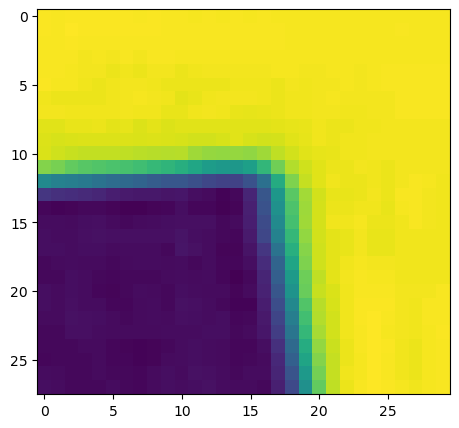

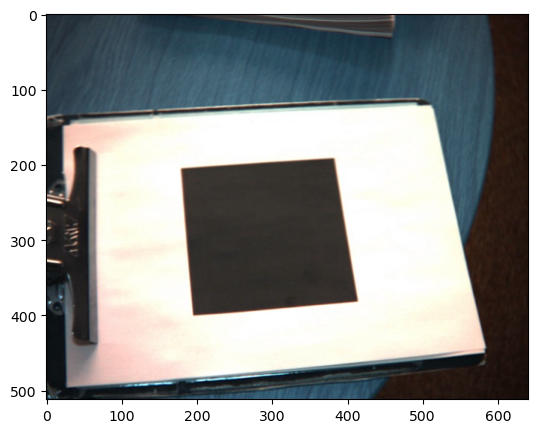

Processing Frame 0
[385.31631829 206.90285636]


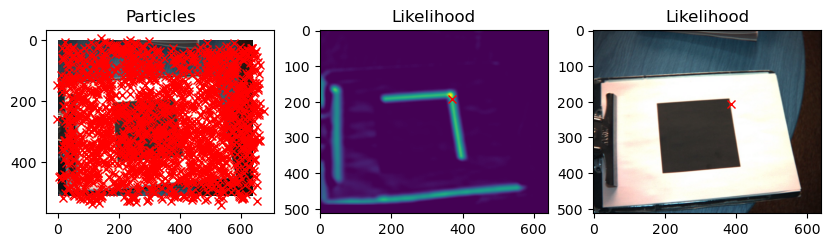

Processing Frame 1
[382.15321938 198.57925097]


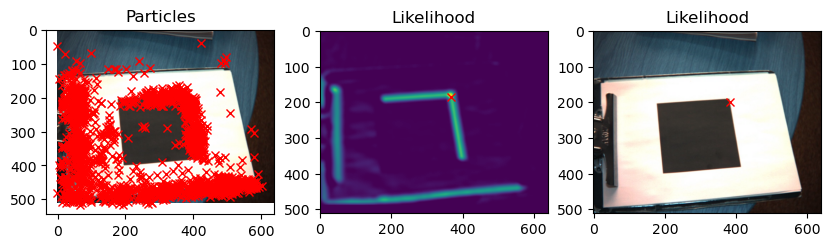

Processing Frame 2
[384.43094878 203.03357912]


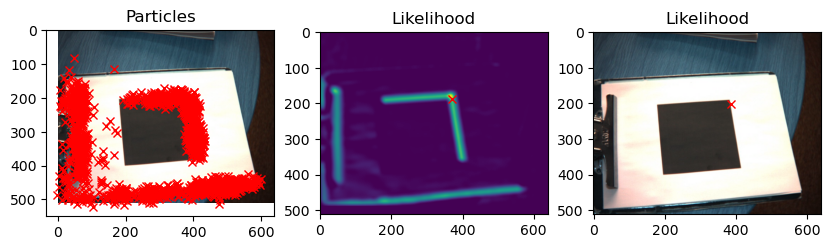

Processing Frame 3
[380.15410038 196.49049838]


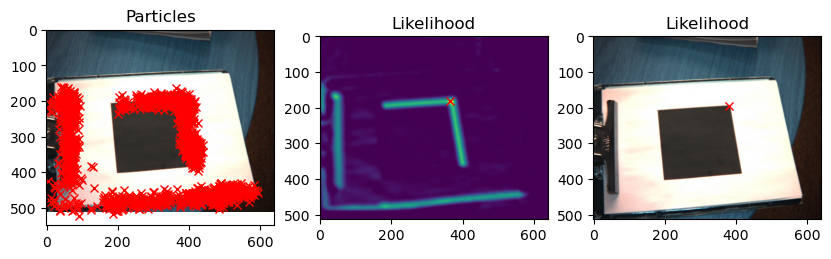

Processing Frame 4
[387.99922947 199.77137816]


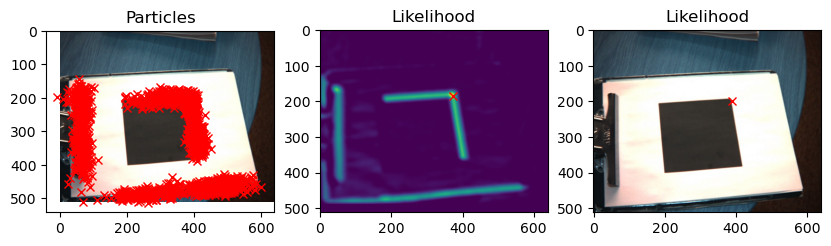

Processing Frame 5
[386.92654878 197.59281501]


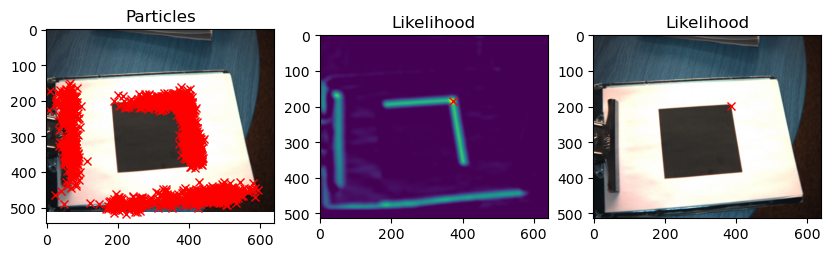

Processing Frame 6
[389.64534874 197.0159563 ]


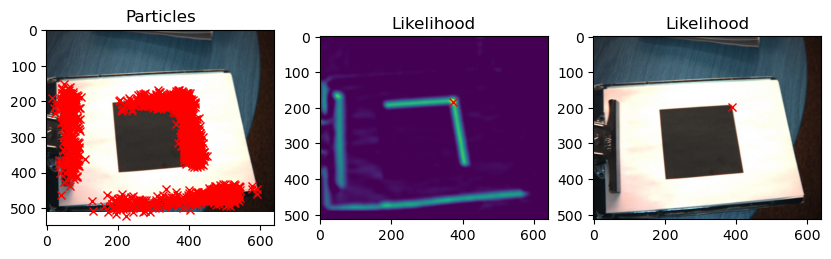

Processing Frame 7
[390.89375304 196.4958629 ]


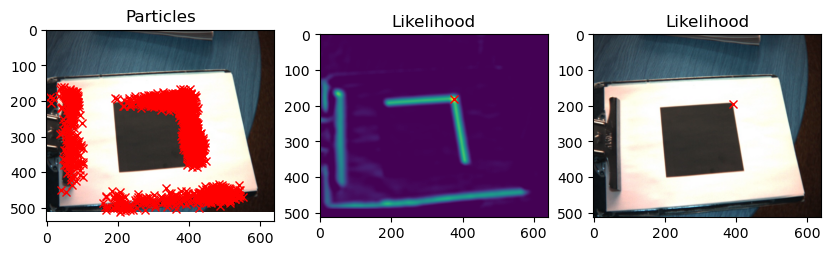

Processing Frame 8
[391.50028549 197.54394317]


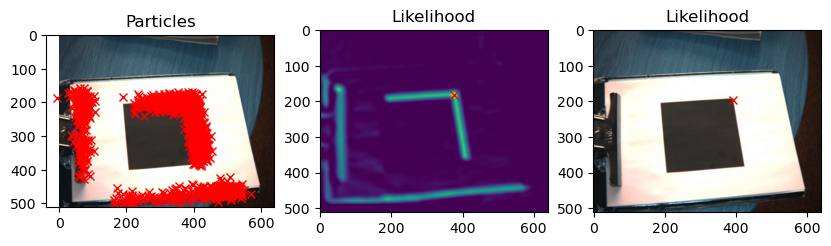

Processing Frame 9
[394.83136802 197.91046792]


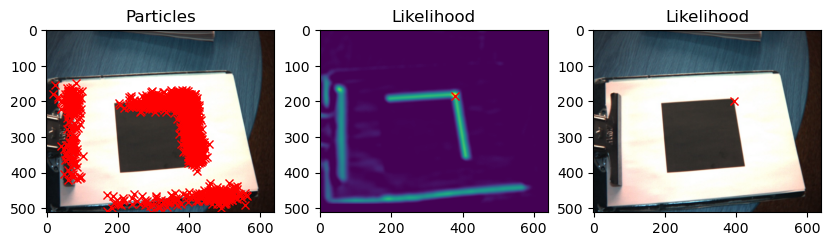

Processing Frame 10
[392.67464124 199.1749053 ]


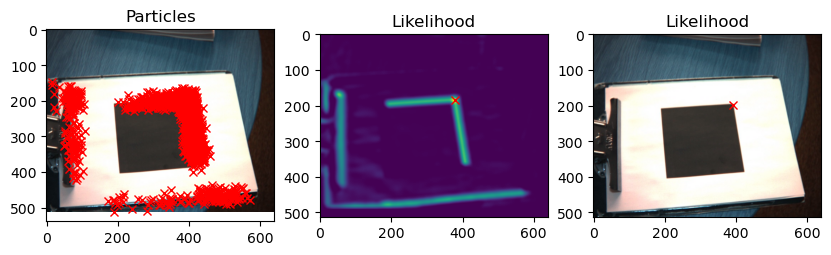

Processing Frame 11
[390.18335704 201.95672357]


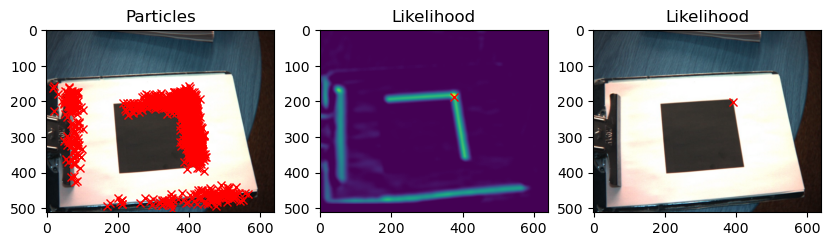

Processing Frame 12
[391.54606215 200.08936139]


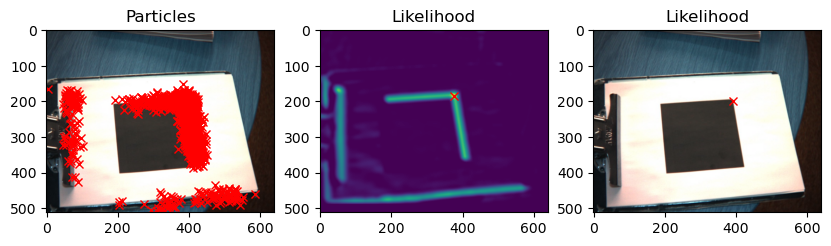

Processing Frame 13
[393.77296971 198.99054472]


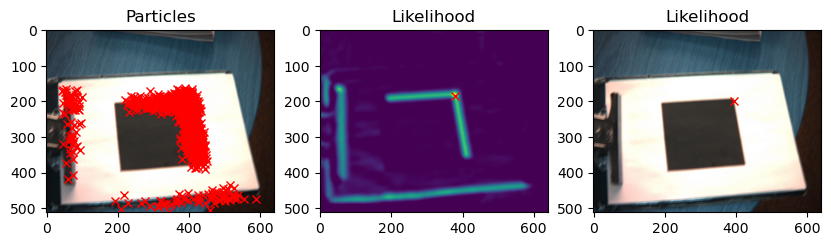

Processing Frame 14
[398.77220488 190.75353971]


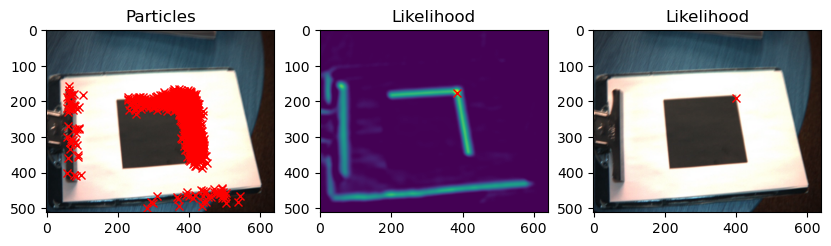

Processing Frame 15
[404.35496121 185.58856041]


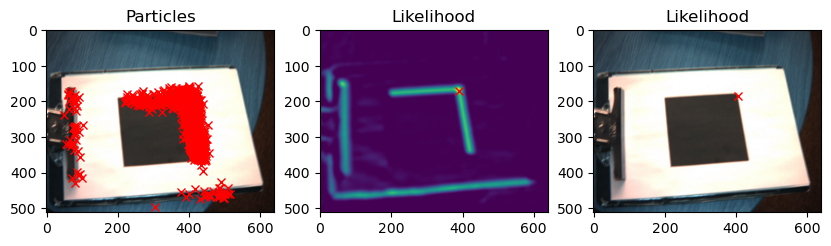

Processing Frame 16
[408.22019713 179.61603682]


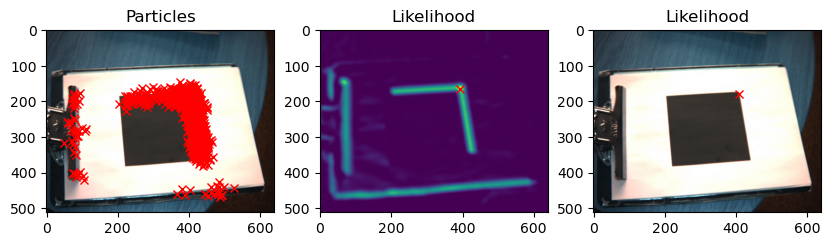

Processing Frame 17
[410.76157917 181.27908787]


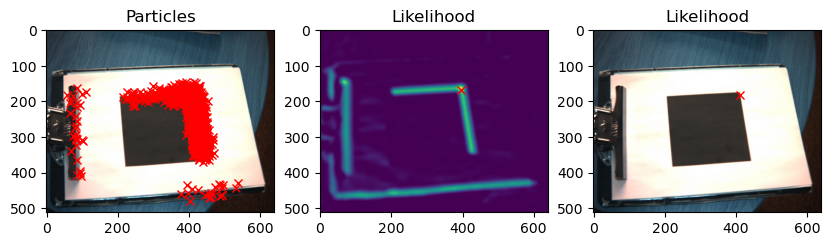

Processing Frame 18
[415.89691859 179.52972495]


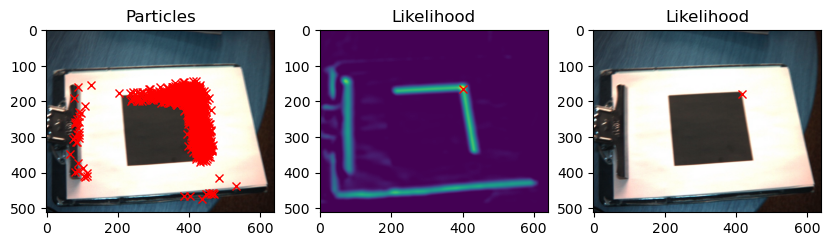

Processing Frame 19
[420.24436634 179.6413711 ]


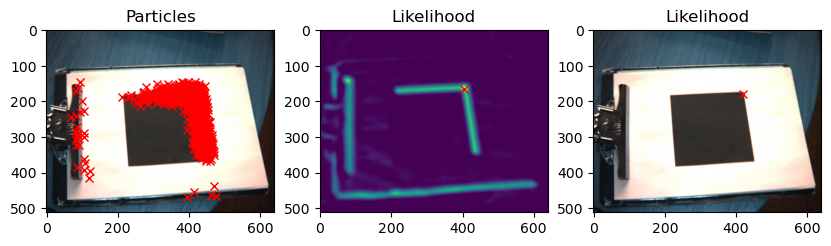

Processing Frame 20
[423.01602252 184.73587844]


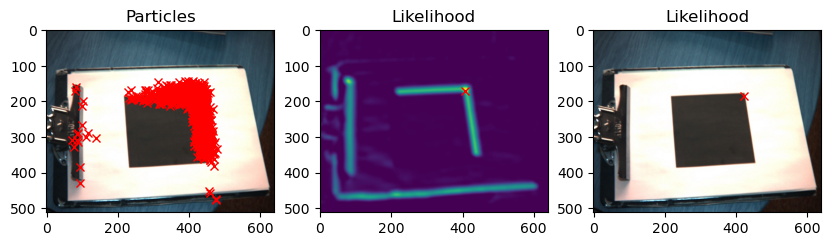

Processing Frame 21
[427.76981302 185.68521722]


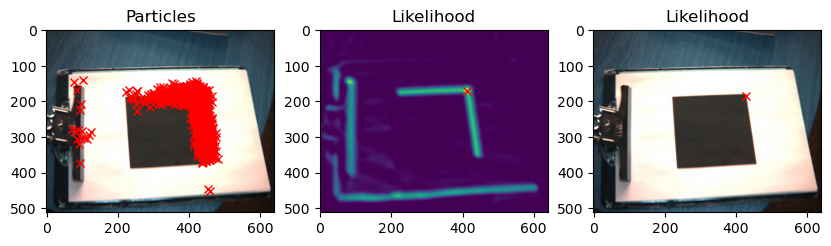

Processing Frame 22
[431.72228244 190.57888723]


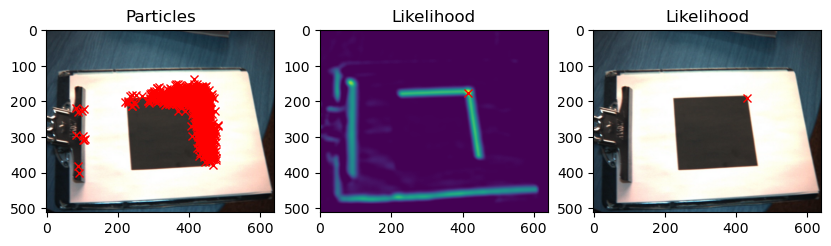

Processing Frame 23
[437.50663578 191.35891119]


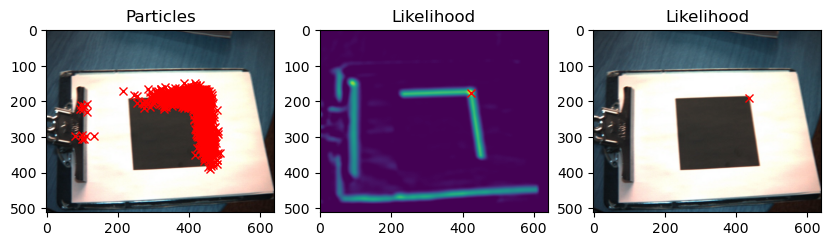

Processing Frame 24
[442.38403309 191.04179625]


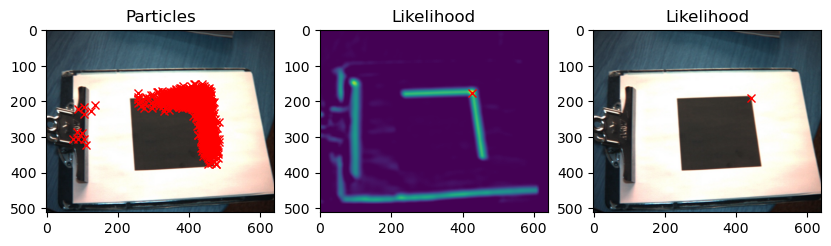

Processing Frame 25
[445.62555506 191.74006303]


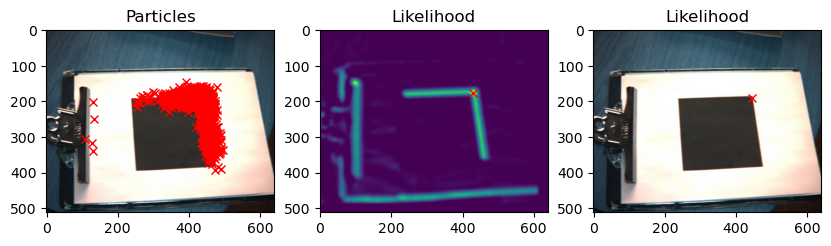

Processing Frame 26
[451.91193551 191.98675655]


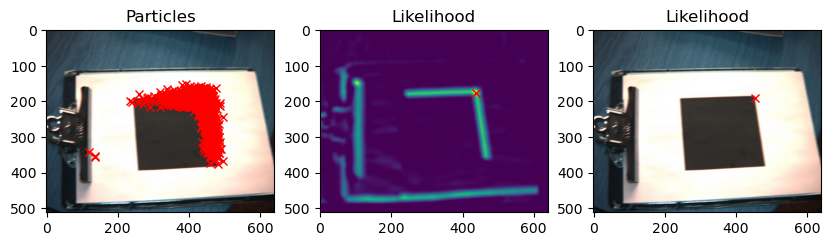

Processing Frame 27
[458.44014817 187.53438921]


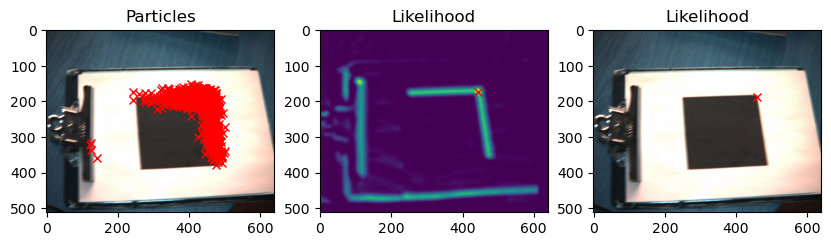

Processing Frame 28
[468.78005235 184.86640446]


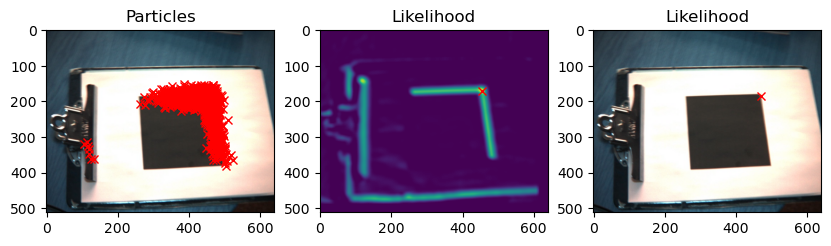

Processing Frame 29
[474.63881079 187.51830905]


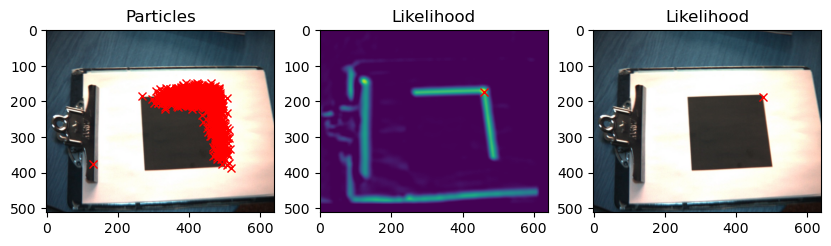

Processing Frame 30
[475.03572355 190.03354286]


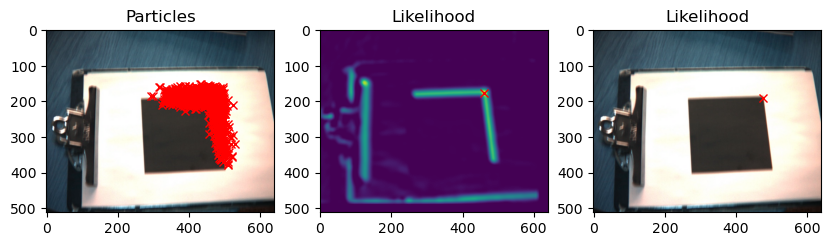

Processing Frame 31
[475.29260822 201.96163963]


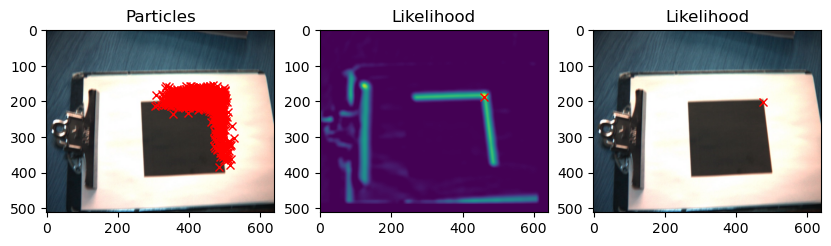

Processing Frame 32
[475.72196057 207.0796911 ]


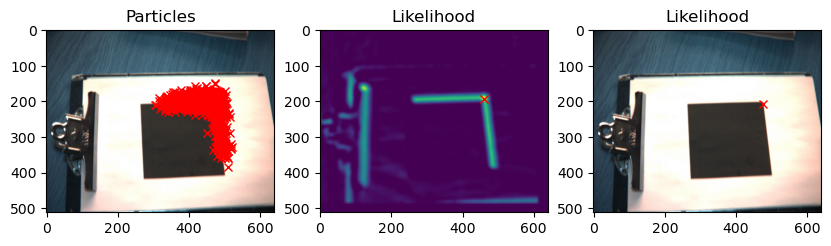

Processing Frame 33
[475.57359695 213.58919511]


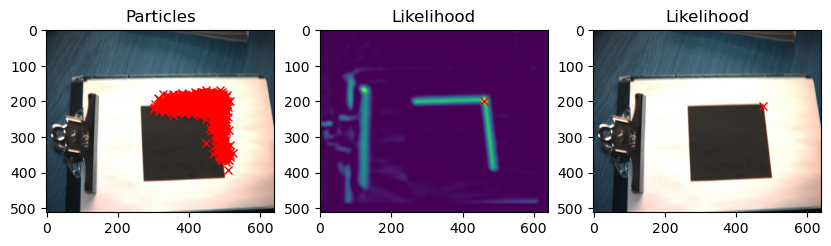

Processing Frame 34
[474.46090206 217.25368345]


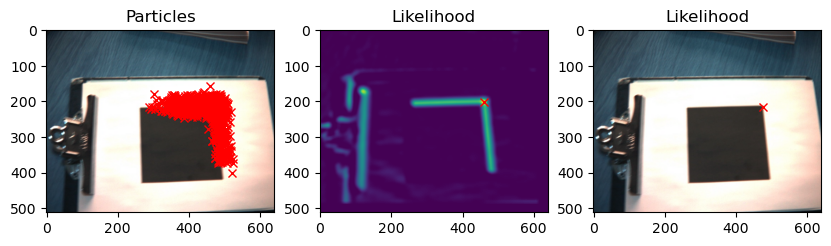

Processing Frame 35
[466.19997074 220.74740063]


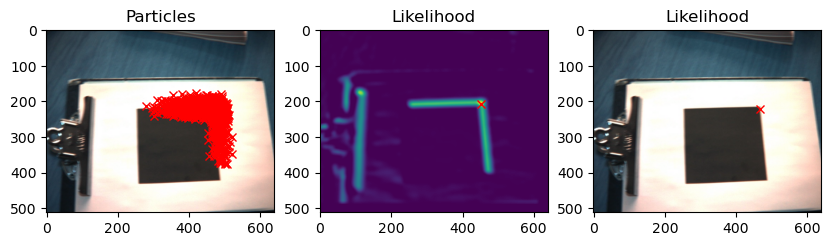

Processing Frame 36
[458.3176683  218.77595183]


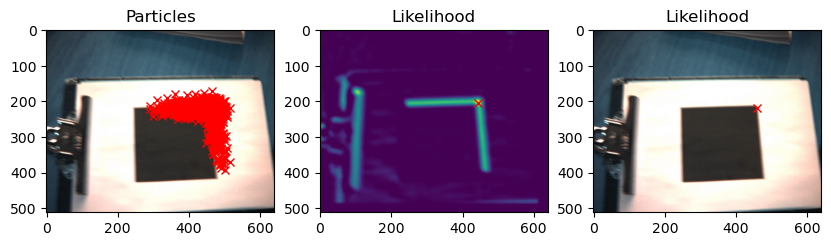

Processing Frame 37
[444.07251758 212.62074573]


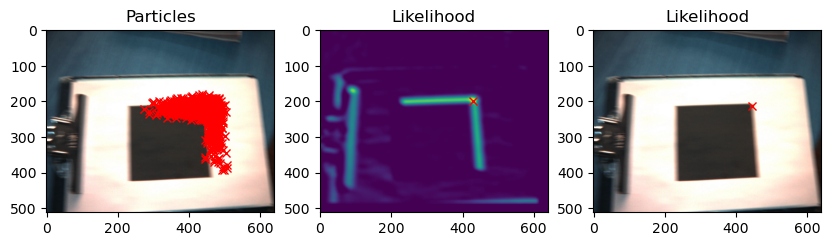

Processing Frame 38
[427.86528519 209.05990944]


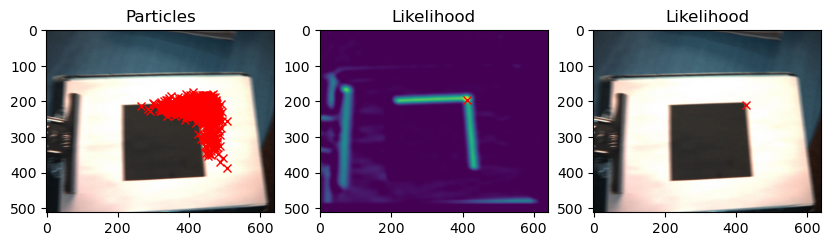

Processing Frame 39
[413.04036557 211.69157137]


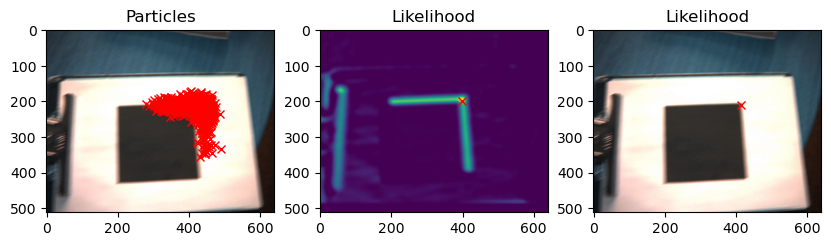

Processing Frame 40
[397.62784261 220.8791167 ]


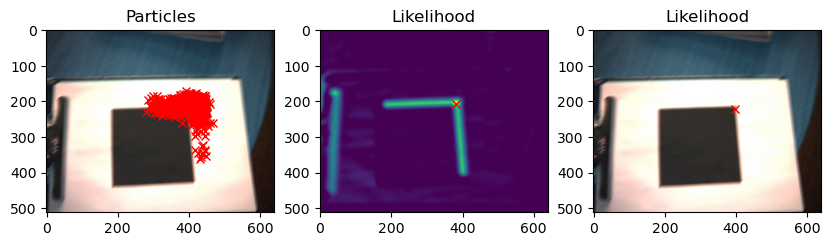

Processing Frame 41
[389.87276662 231.76983252]


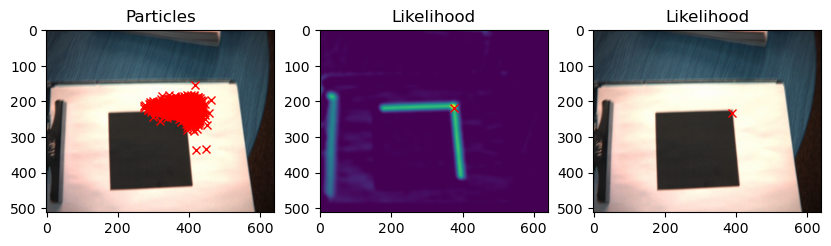

Processing Frame 42
[384.99302787 238.37867242]


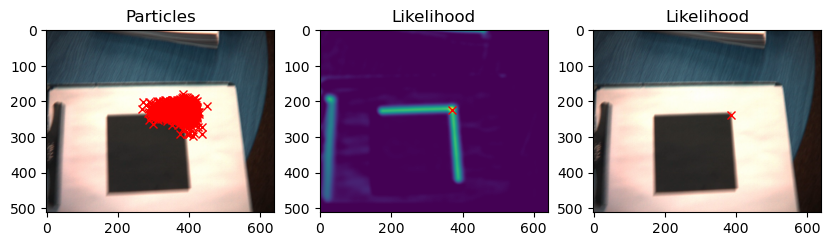

Processing Frame 43
[374.24068174 252.05292201]


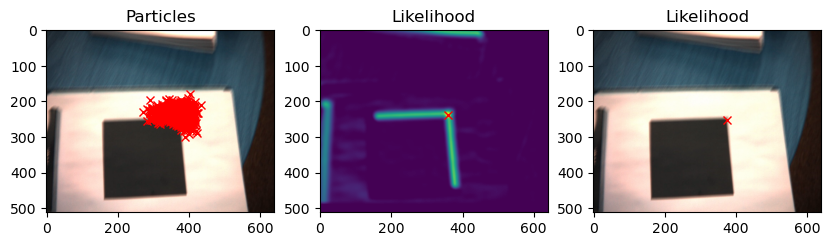

Processing Frame 44
[369.59983755 263.32845702]


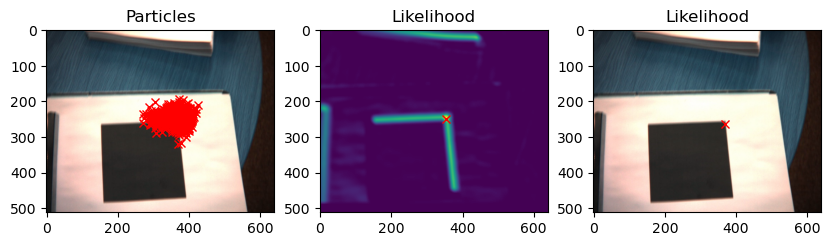

Processing Frame 45
[369.97046138 269.32134007]


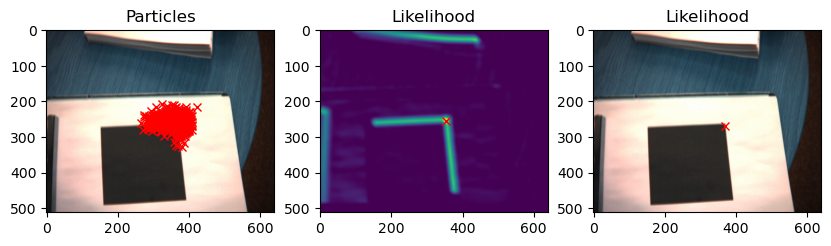

Processing Frame 46
[369.56051542 272.14980306]


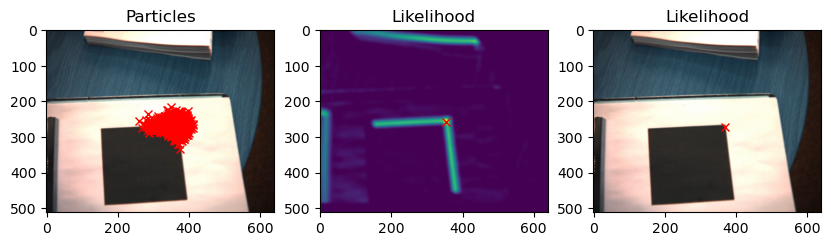

Processing Frame 47
[372.10862652 267.80987671]


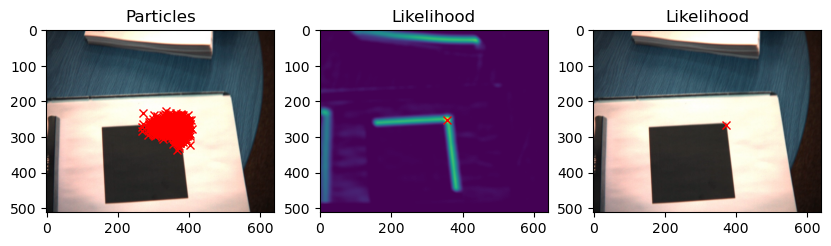

Processing Frame 48
[372.30211264 261.80005796]


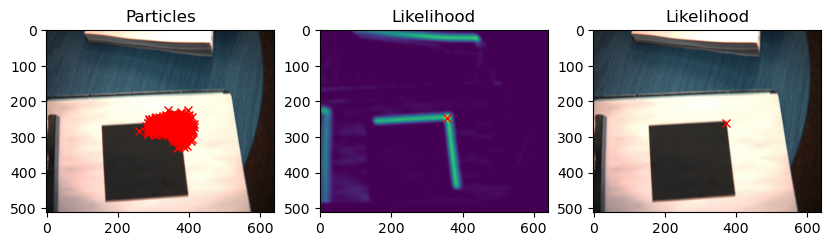

Processing Frame 49
[375.92275808 252.92720298]


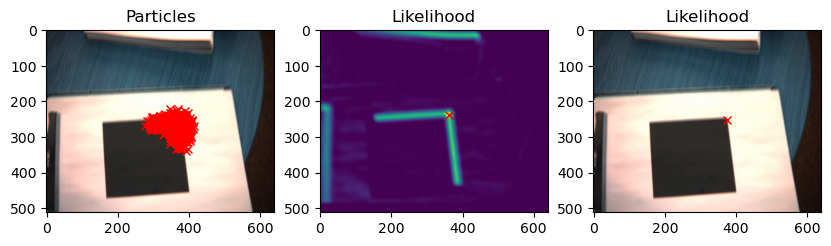

Processing Frame 50
[377.10128428 244.44567293]


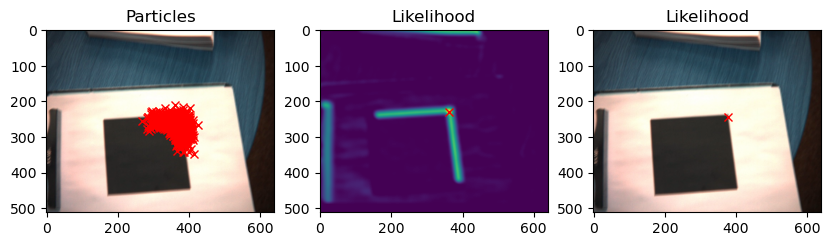

Processing Frame 51
[380.91055075 234.52343096]


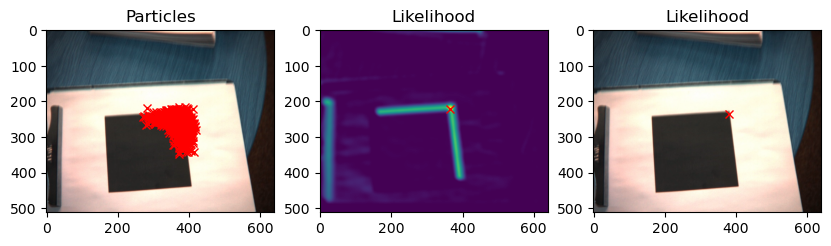

Processing Frame 52
[381.73140657 232.61084207]


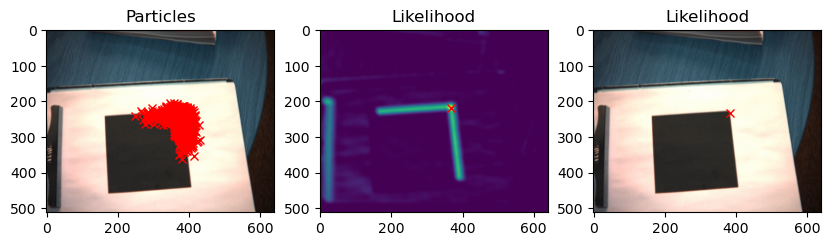

Processing Frame 53
[379.90197502 237.95392188]


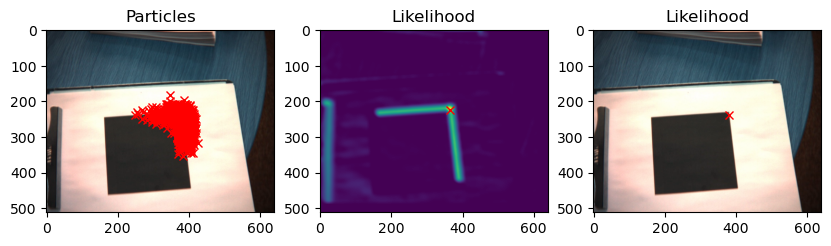

Processing Frame 54
[378.54027172 241.61999824]


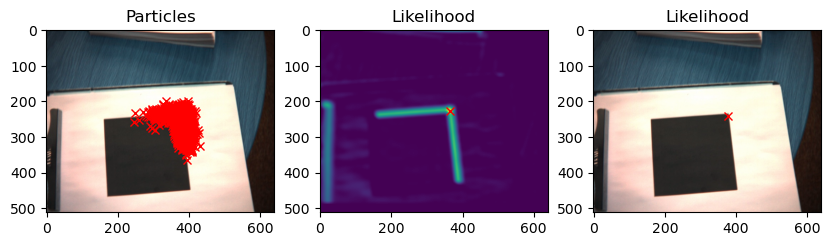

Processing Frame 55
[375.76772045 243.4362653 ]


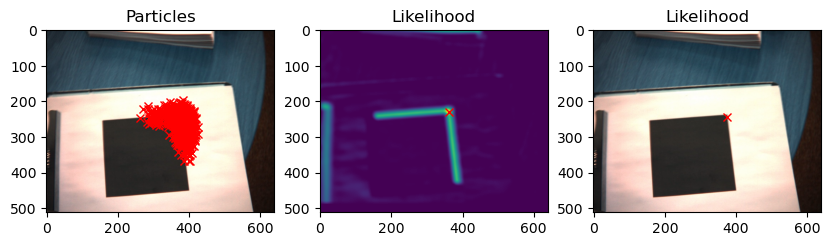

Processing Frame 56
[372.05011619 241.39359327]


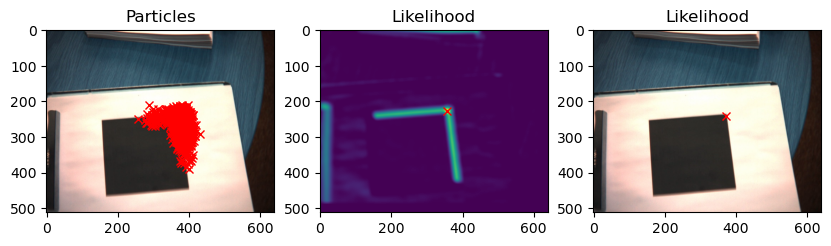

Processing Frame 57
[373.42013031 233.32923212]


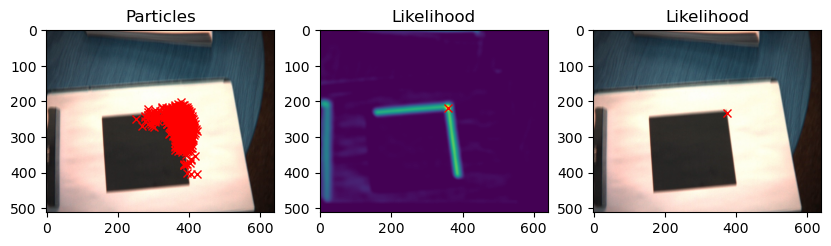

Processing Frame 58
[373.32521525 222.49716834]


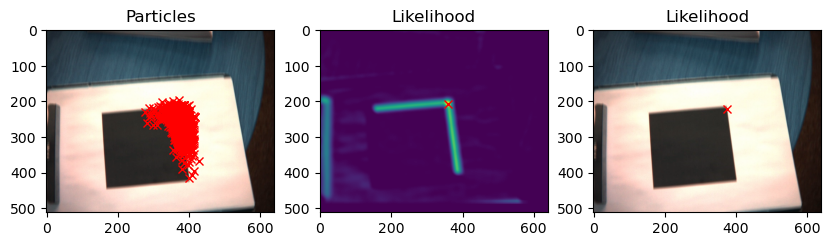

Processing Frame 59
[373.92050309 210.6230384 ]


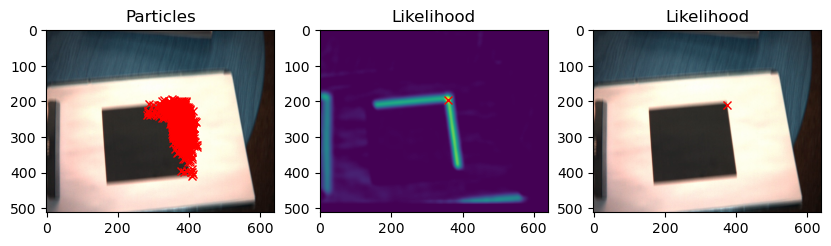

Processing Frame 60
[371.51379252 191.71010027]


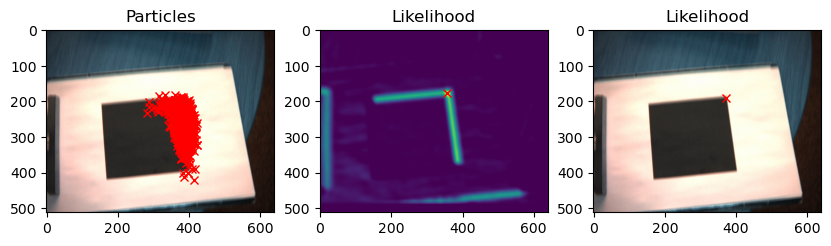

Processing Frame 61
[376.04240279 189.59039182]


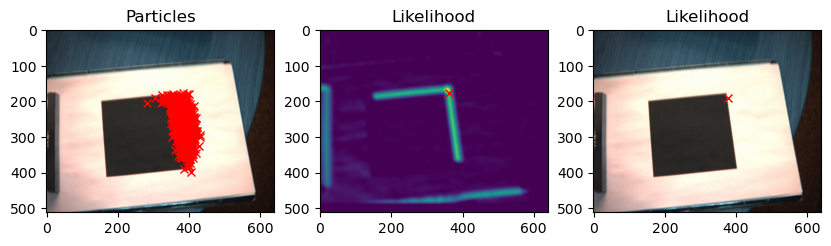

Processing Frame 62
[372.09894672 178.47576097]


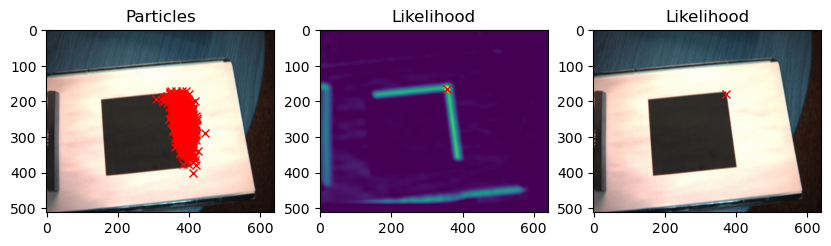

Processing Frame 63
[370.34544482 177.74024139]


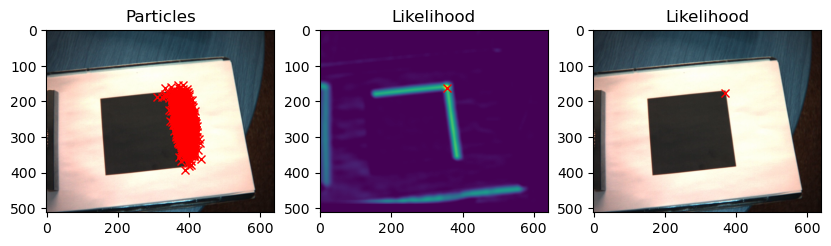

Processing Frame 64
[370.2742117  173.11304518]


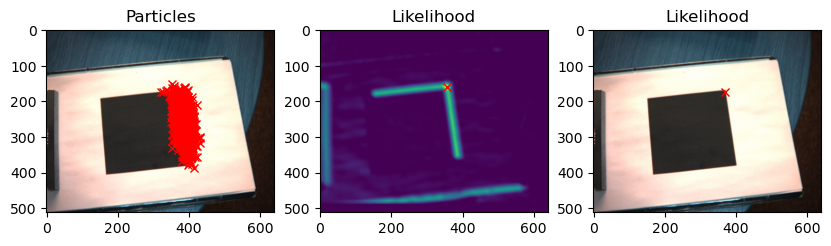

Processing Frame 65
[371.75492654 171.79747487]


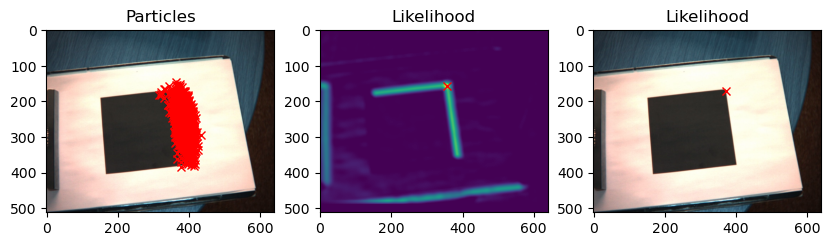

Processing Frame 66
[370.50242241 171.18678104]


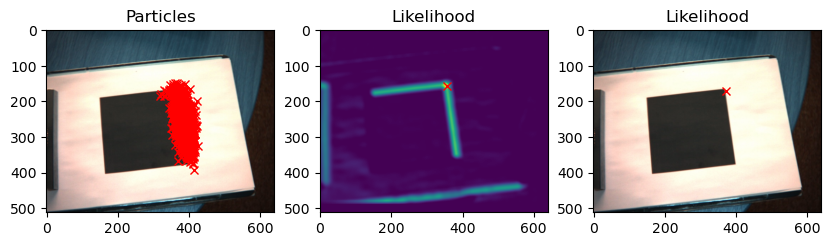

Processing Frame 67
[365.13619417 169.53768704]


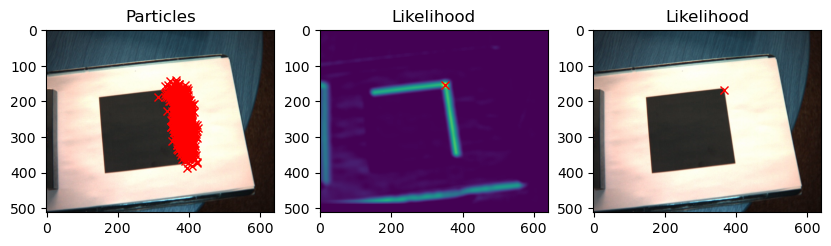

Processing Frame 68
[367.32929951 169.18561561]


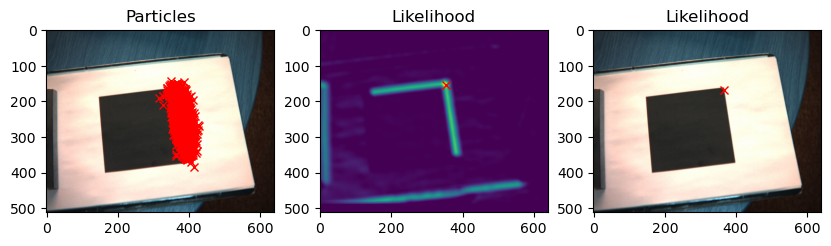

Processing Frame 69
[365.3545512  166.60125869]


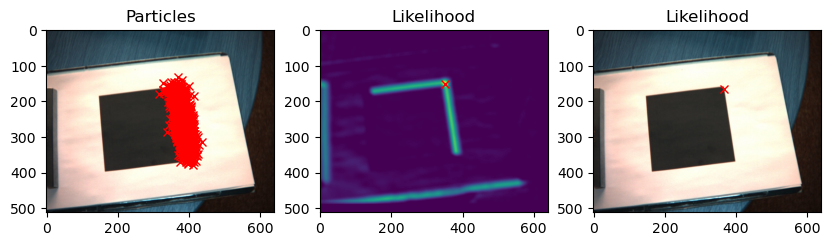

Processing Frame 70
[363.51295619 163.44170836]


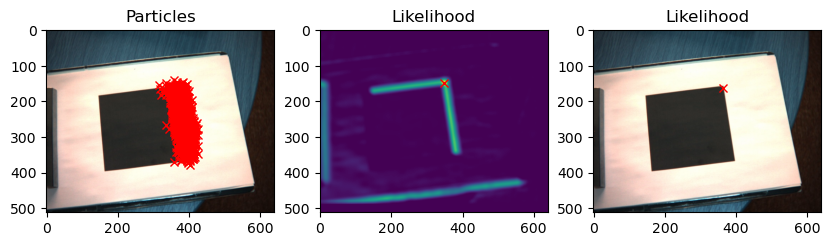

Processing Frame 71
[364.4023475  164.27438364]


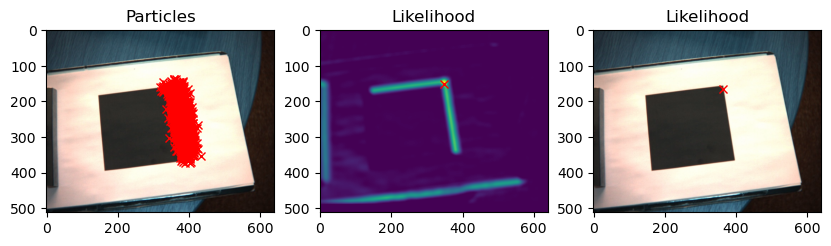

Processing Frame 72
[364.55838246 161.23682982]


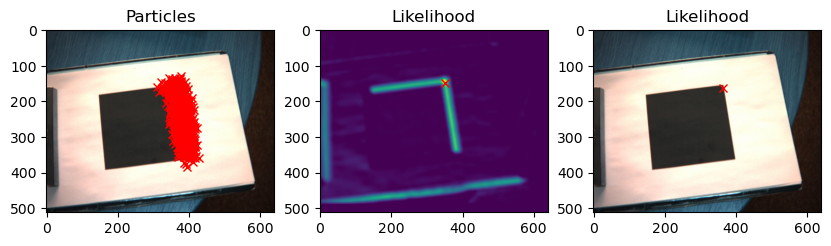

Processing Frame 73
[366.06886785 159.6103024 ]


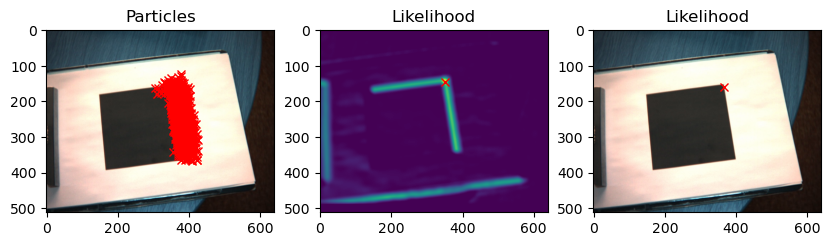

Processing Frame 74
[365.66162236 162.59764078]


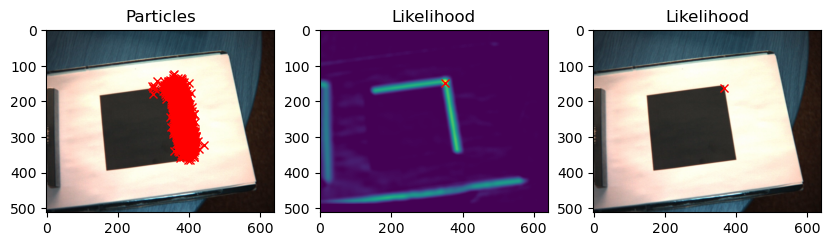

Processing Frame 75
[369.50623718 164.89789598]


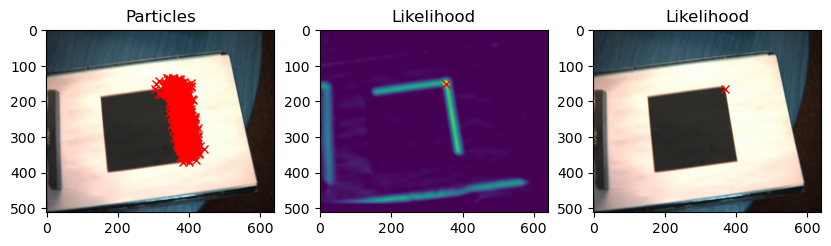

Processing Frame 76
[372.19254156 169.99682384]


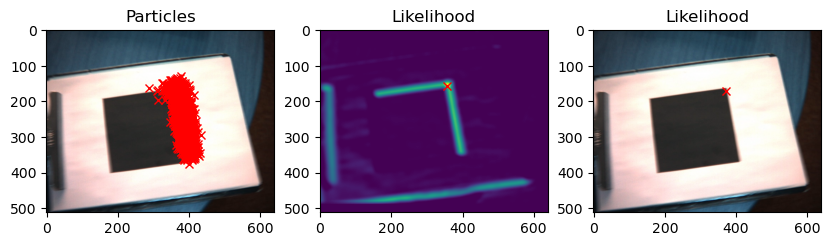

Processing Frame 77
[385.84519866 165.21126641]


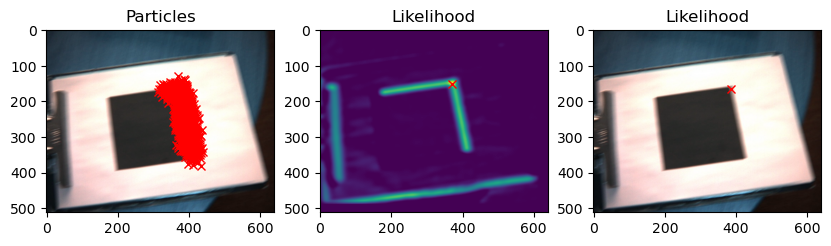

Processing Frame 78
[399.17699989 156.17179493]


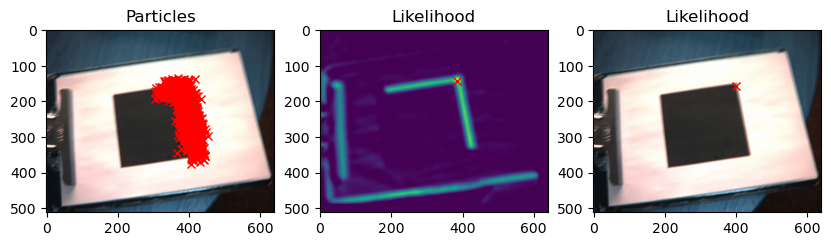

Processing Frame 79
[406.96546883 150.97606946]


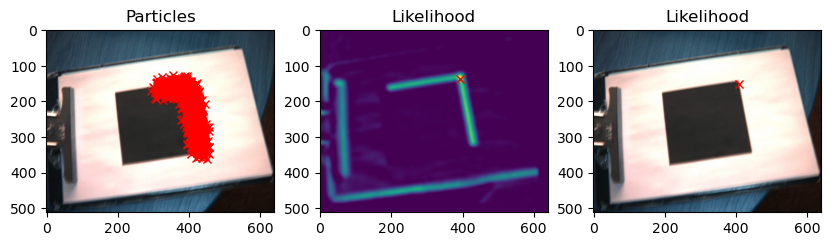

Processing Frame 80
[411.66794107 139.30686401]


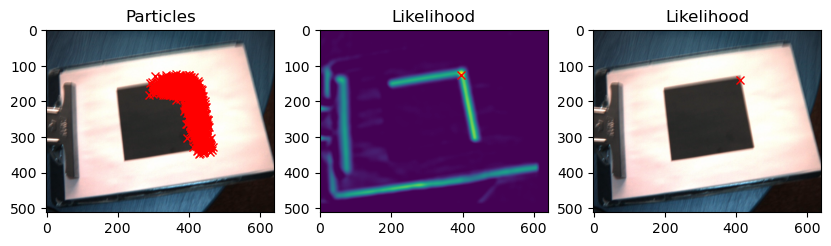

Processing Frame 81
[414.22734965 134.45271929]


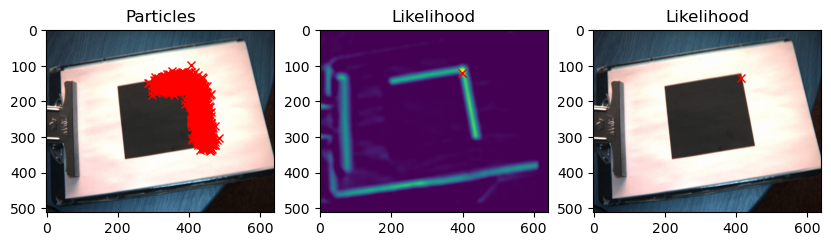

Processing Frame 82
[416.65795002 128.0637261 ]


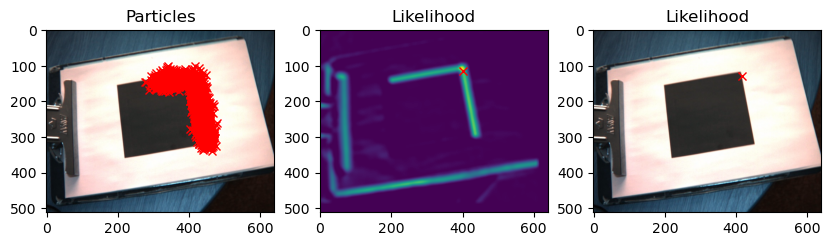

Processing Frame 83
[410.2142678  120.40485864]


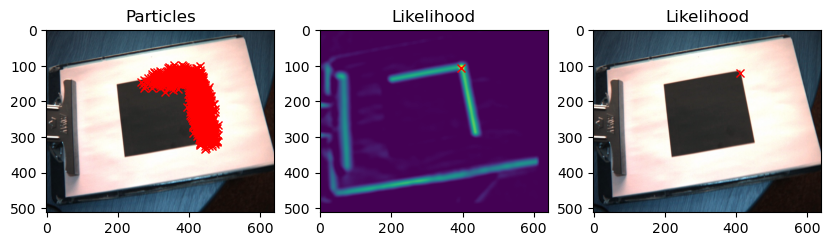

Processing Frame 84
[412.06257529 118.74272401]


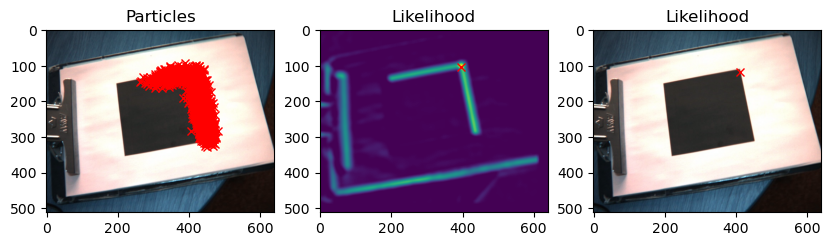

Processing Frame 85
[411.79811353 114.78855743]


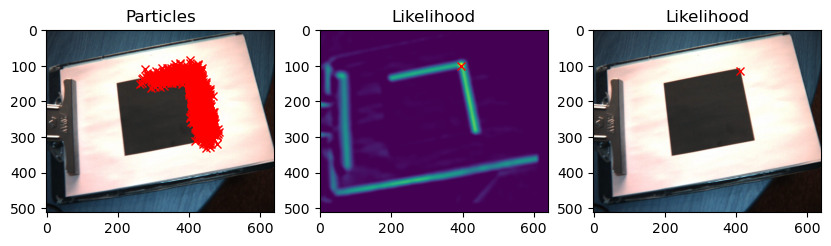

Processing Frame 86
[408.49506274 113.96812209]


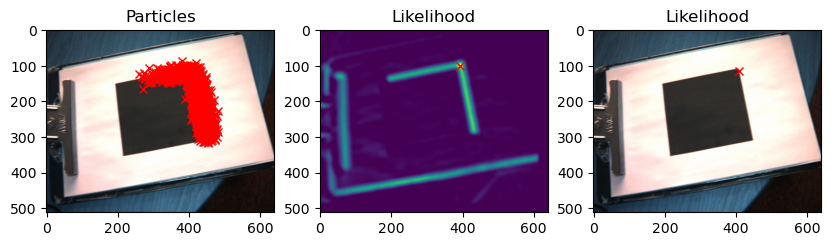

Processing Frame 87
[402.90771306 115.02468653]


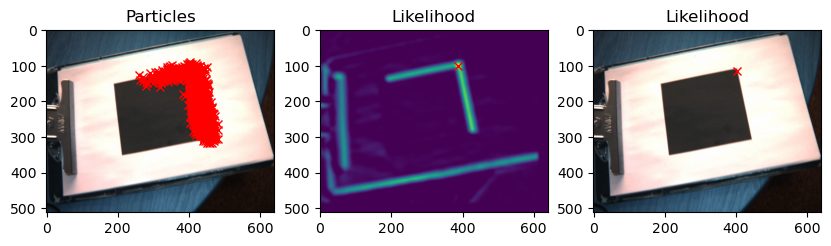

Processing Frame 88
[399.98237672 110.10881288]


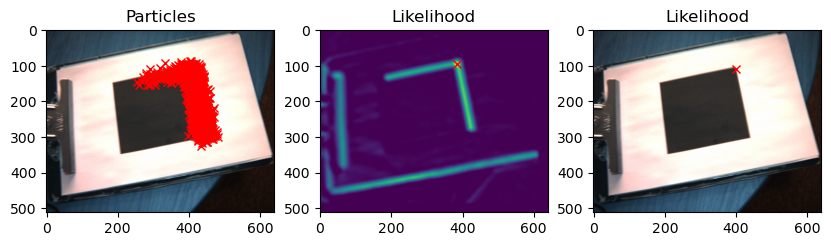

Processing Frame 89
[395.35038359 111.20328238]


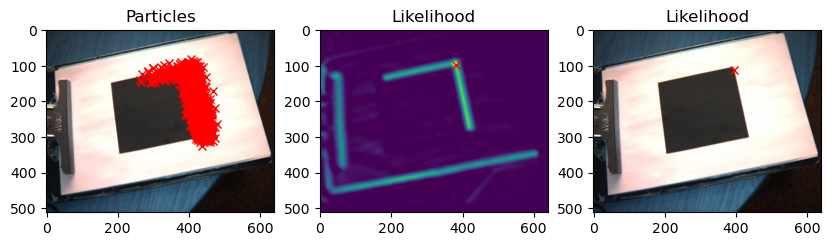

Processing Frame 90
[392.02197369 109.65931351]


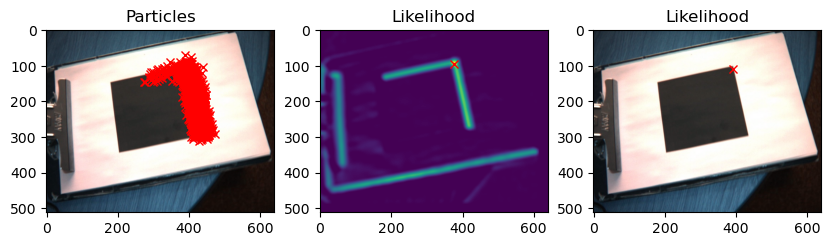

Processing Frame 91
[390.00082203 106.02521063]


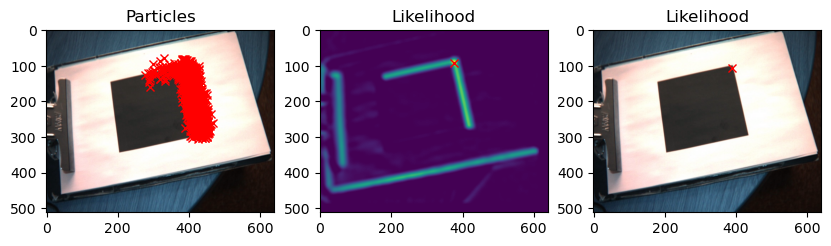

Processing Frame 92
[391.26312486 106.91951353]


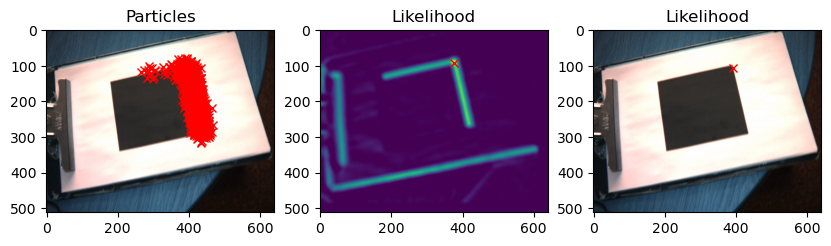

Processing Frame 93
[389.94139624 102.11202931]


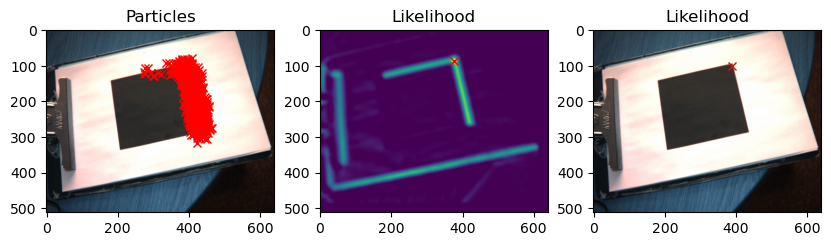

Processing Frame 94
[390.47764392  99.07303774]


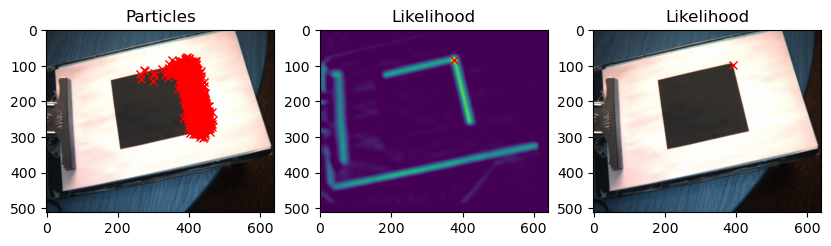

Processing Frame 95
[391.78057668  98.7191986 ]


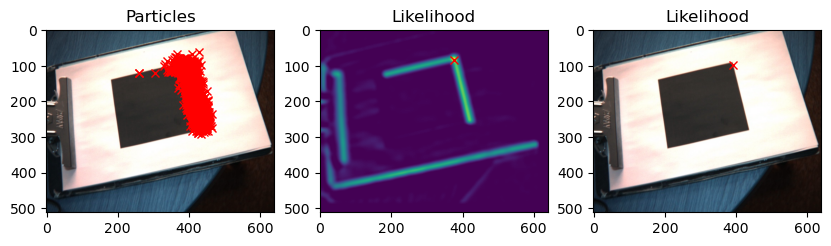

Processing Frame 96
[389.42602544 100.4698728 ]


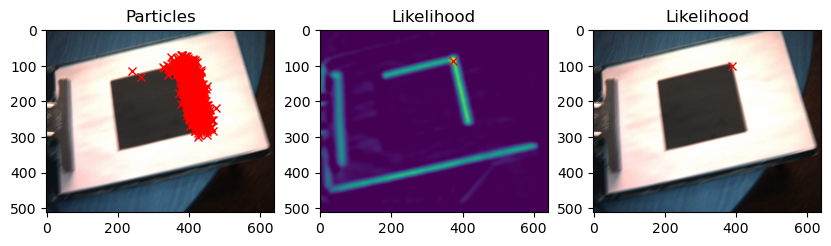

Processing Frame 97
[374.91850814 112.44215104]


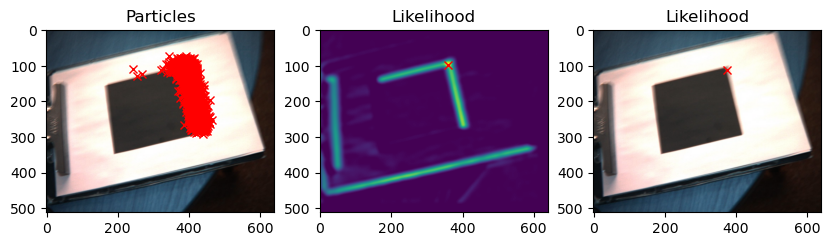

Processing Frame 98
[366.21769844 118.31495736]


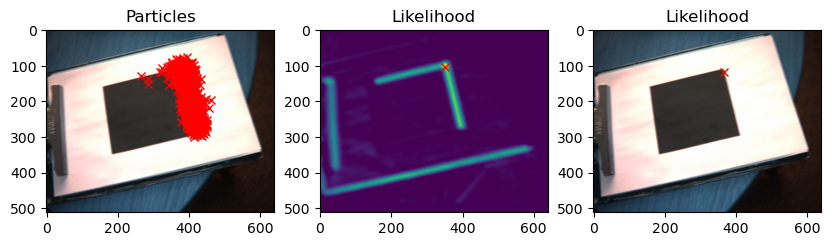

Processing Frame 99
[360.91594295 121.19823039]


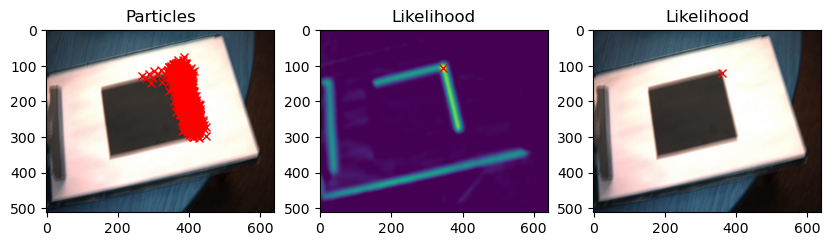

Processing Frame 100
[356.03087015 137.80517234]


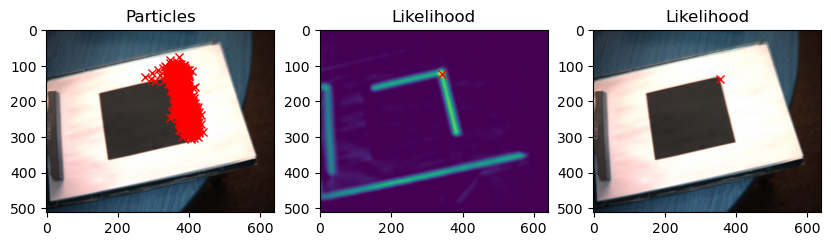

Processing Frame 101
[351.74452348 139.1273593 ]


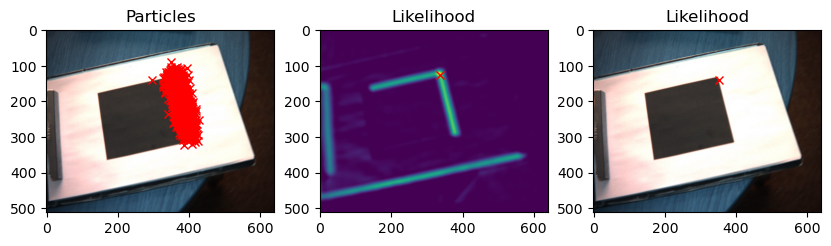

Processing Frame 102
[344.3767643  142.36256535]


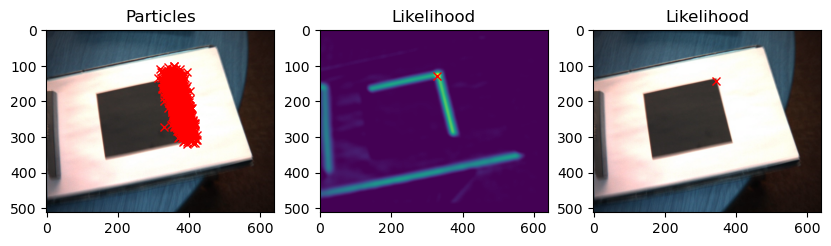

Processing Frame 103
[346.26791376 134.30994668]


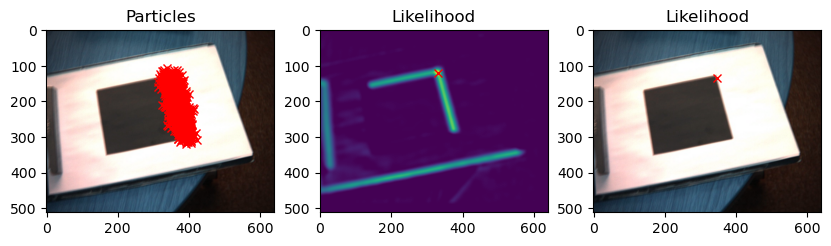

Processing Frame 104
[348.66618731 132.71860486]


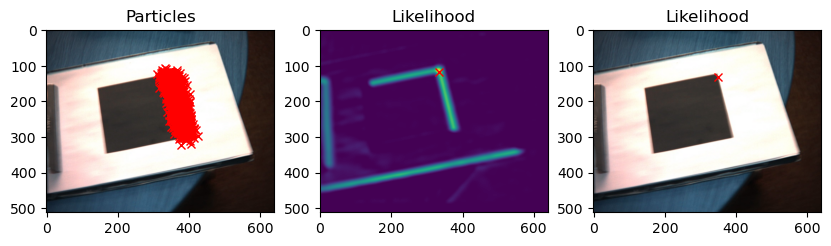

Processing Frame 105
[338.37218783 130.36907622]


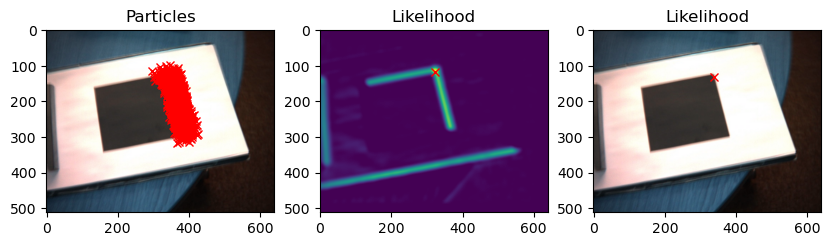

Processing Frame 106
[341.23169305 125.62862461]


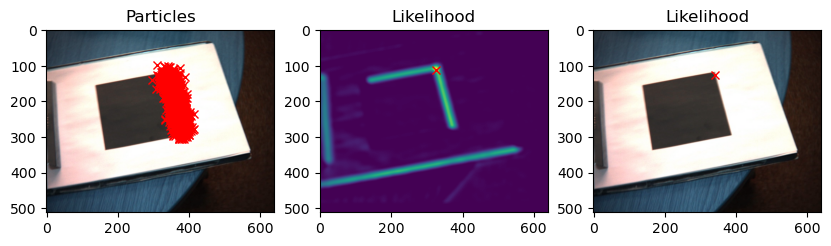

Processing Frame 107
[344.19471299 123.60223873]


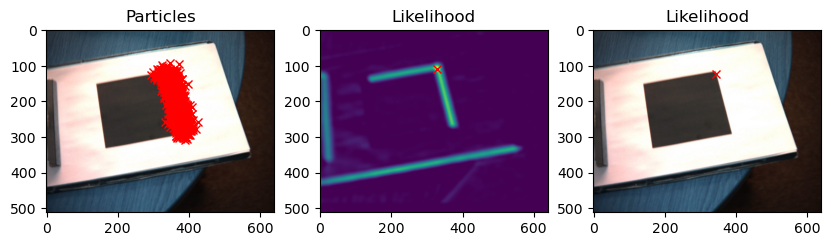

Processing Frame 108
[340.89968788 123.83403466]


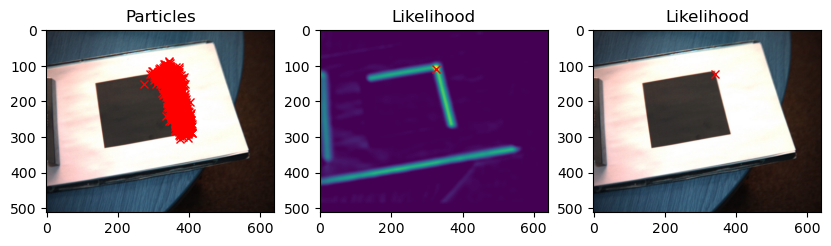

Processing Frame 109
[340.14481642 124.39622003]


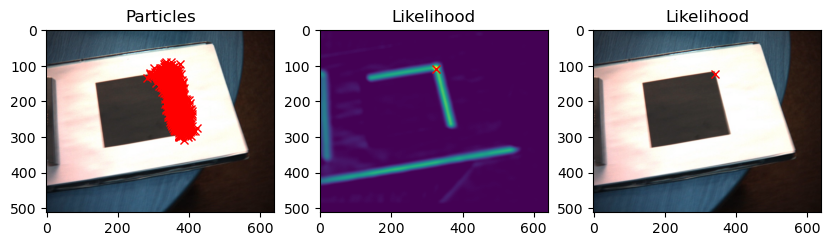

Processing Frame 110
[334.63736606 127.79075476]


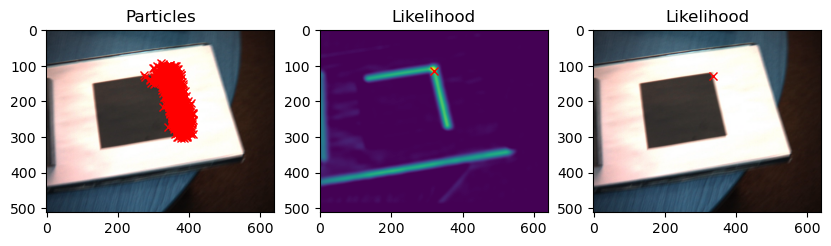

Processing Frame 111
[326.21409233 137.55662996]


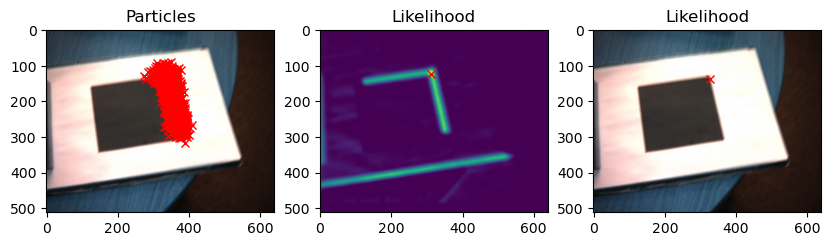

Processing Frame 112
[320.88140188 146.12139173]


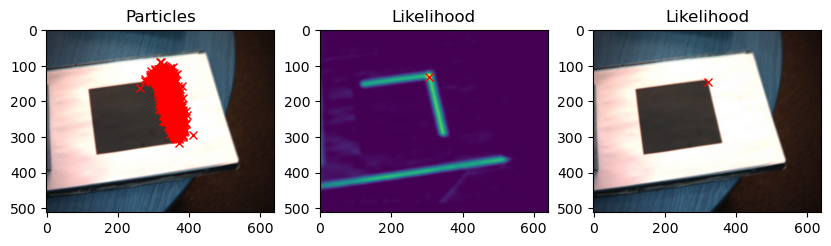

Processing Frame 113
[317.27623803 152.67878356]


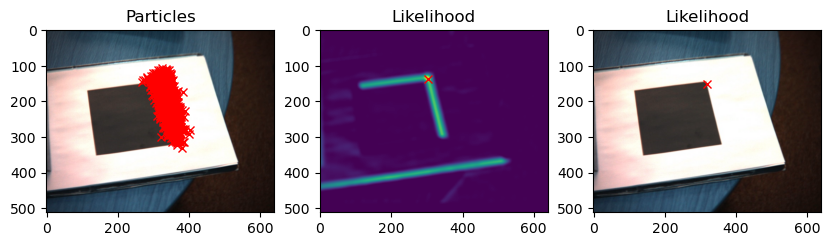

Processing Frame 114
[320.26571698 154.09531146]


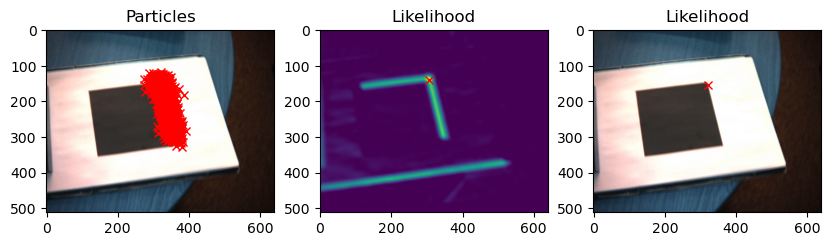

Processing Frame 115
[322.40520299 161.637288  ]


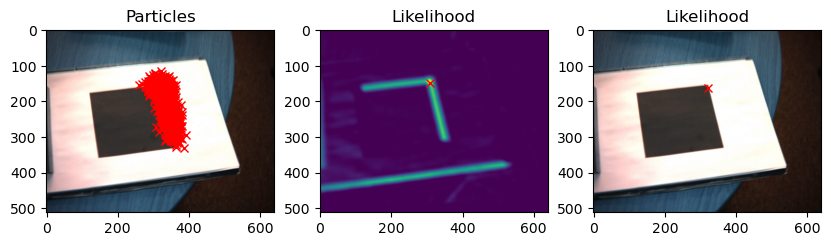

Processing Frame 116
[327.36363271 161.21500522]


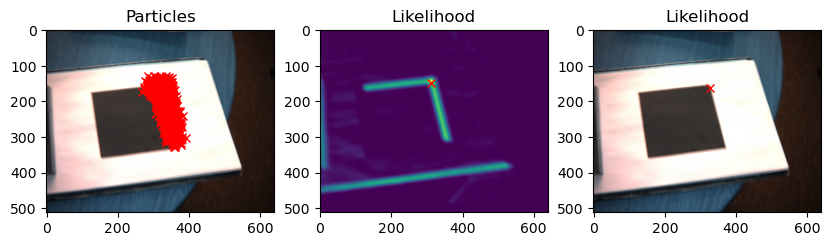

Processing Frame 117
[331.75775977 167.51511751]


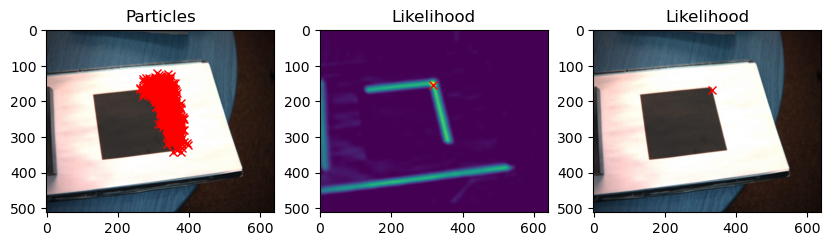

Processing Frame 118
[335.29155439 168.28739451]


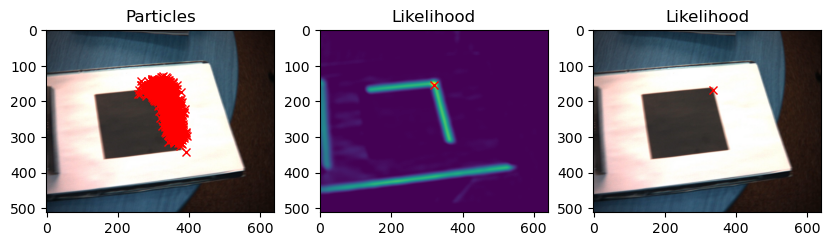

Processing Frame 119
[344.91090196 166.84489062]


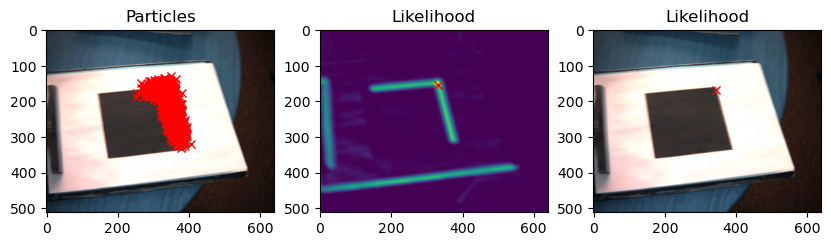

Processing Frame 120
[351.38900375 169.13931672]


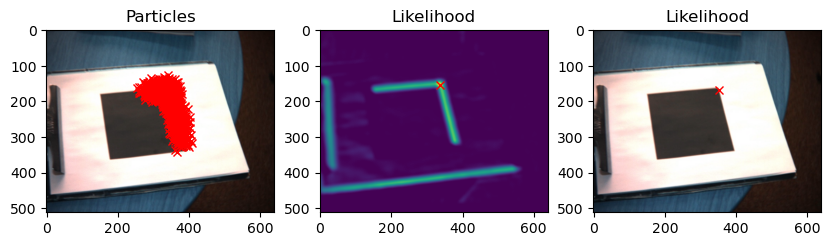

Processing Frame 121
[355.73976429 170.47611105]


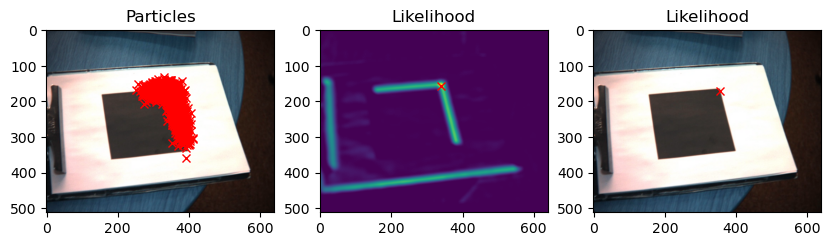

Processing Frame 122
[358.61850316 168.09177967]


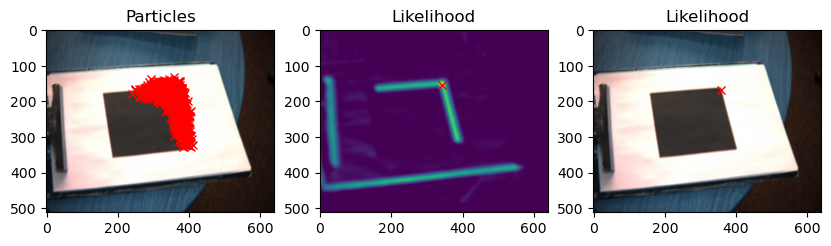

Processing Frame 123
[360.8187247  163.68559907]


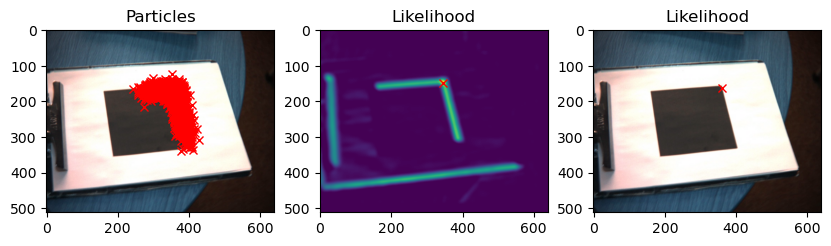

Processing Frame 124
[356.38459315 166.71883235]


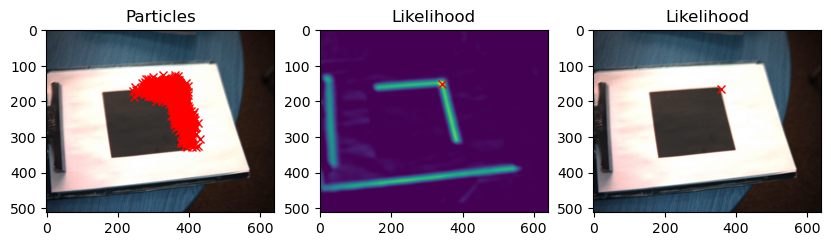

Processing Frame 125
[353.5590052  167.52561446]


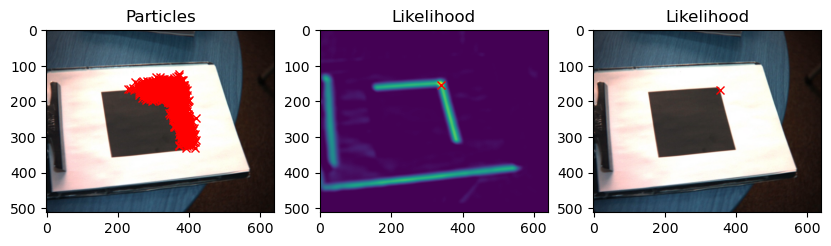

Processing Frame 126
[357.8118672  165.14309806]


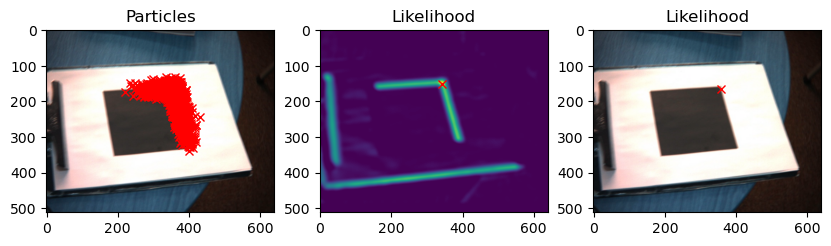

Processing Frame 127
[362.42872116 161.19243   ]


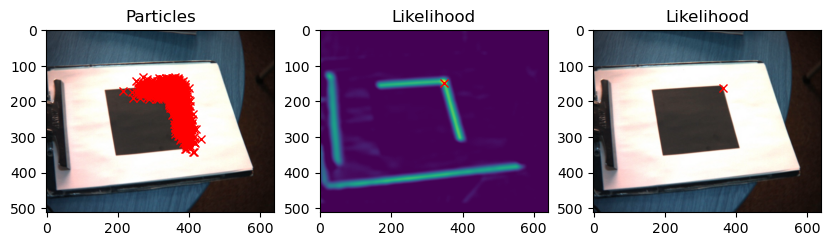

Processing Frame 128
[364.68147906 164.4026287 ]


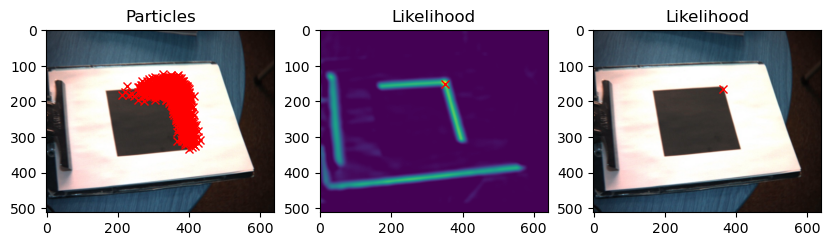

Processing Frame 129
[367.25620512 166.39552718]


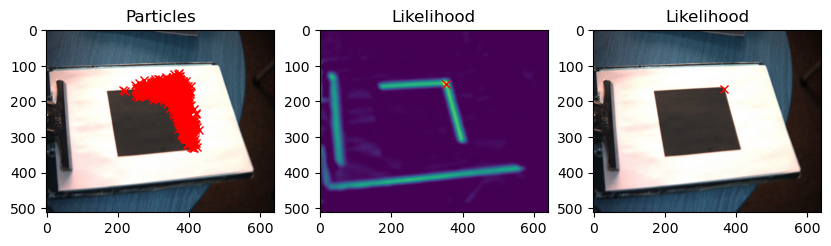

Processing Frame 130
[362.76666063 171.57586386]


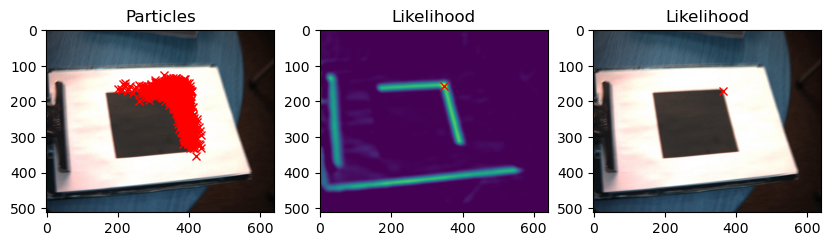

Processing Frame 131
[352.55255187 172.01059196]


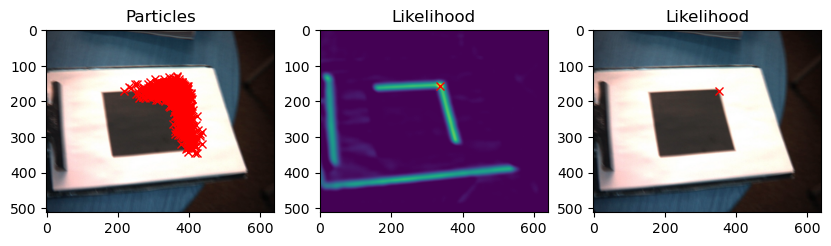

Processing Frame 132
[345.22192141 164.39089618]


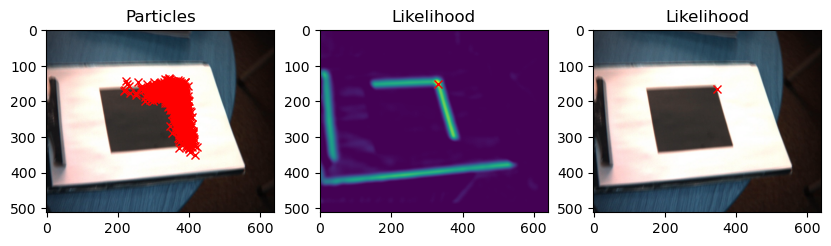

Processing Frame 133
[345.98532199 154.75854205]


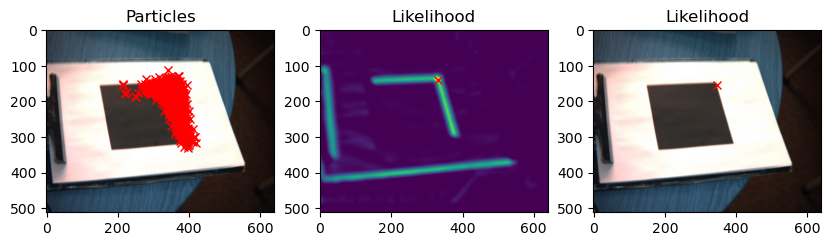

Processing Frame 134
[342.37795282 149.72385365]


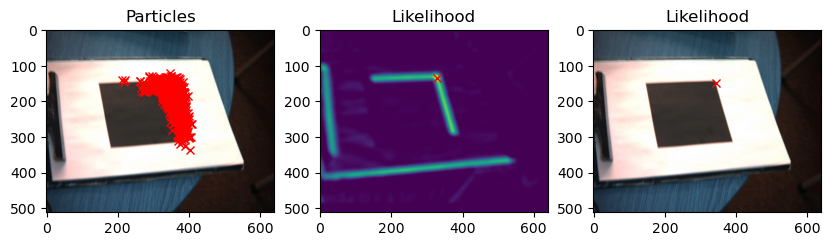

Processing Frame 135
[342.97891578 143.92329812]


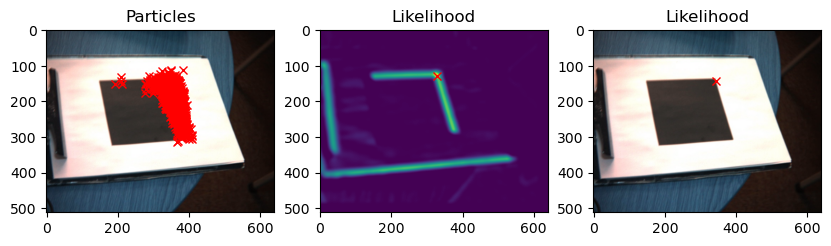

Processing Frame 136
[344.59223152 138.41691377]


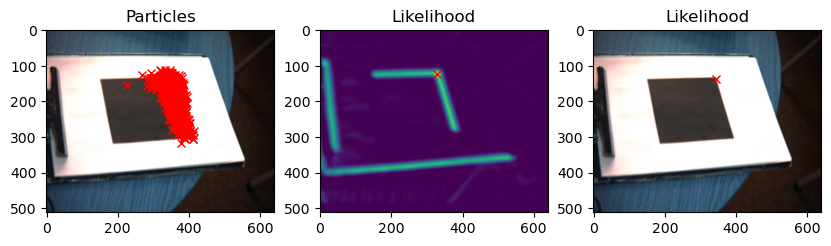

Processing Frame 137
[346.99998847 134.08291085]


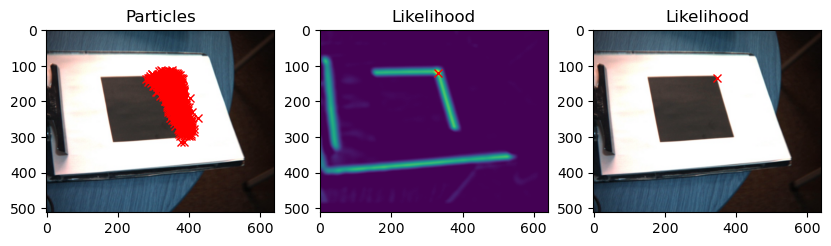

Processing Frame 138
[343.28443676 134.55506988]


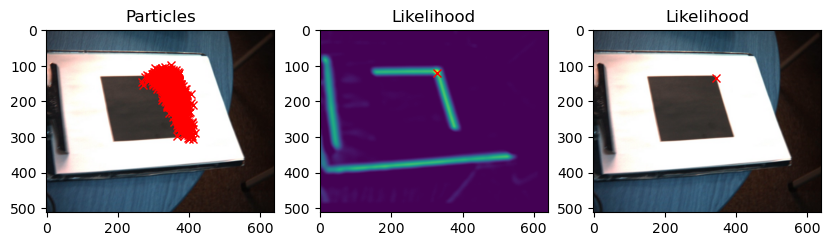

Processing Frame 139
[347.9492148  132.11144851]


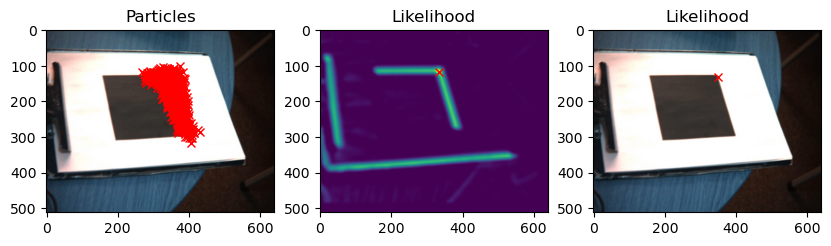

Processing Frame 140
[352.08260442 131.64806416]


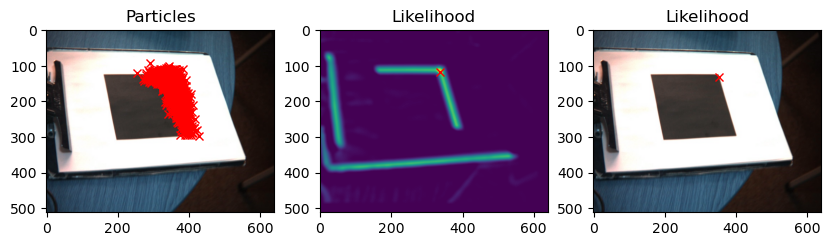

Processing Frame 141
[349.24537682 134.58354444]


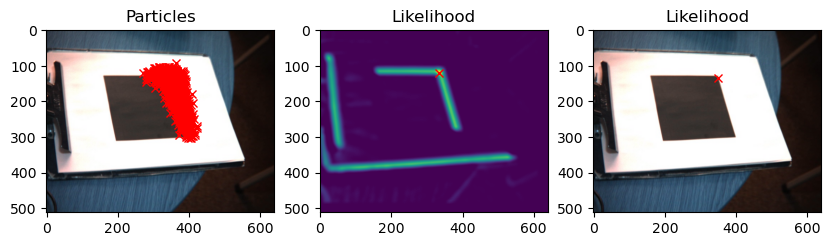

Processing Frame 142
[347.23564886 132.84142961]


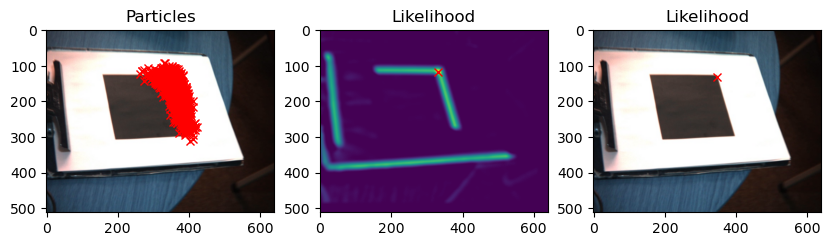

Processing Frame 143
[342.67494849 131.12362618]


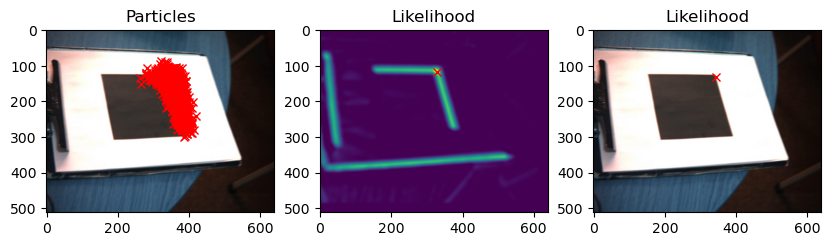

Processing Frame 144
[335.59367026 135.56123474]


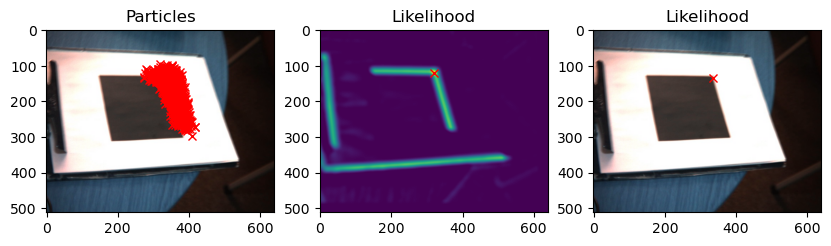

Processing Frame 145
[330.03128896 133.03919973]


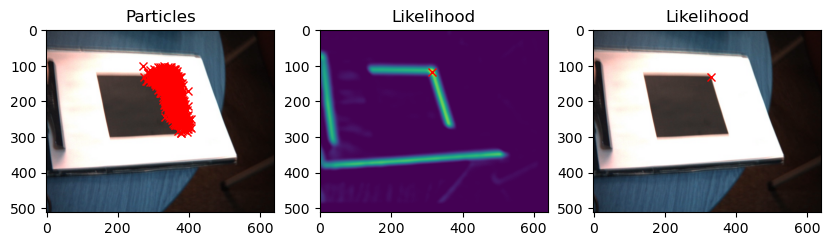

Processing Frame 146
[323.29629338 126.11857401]


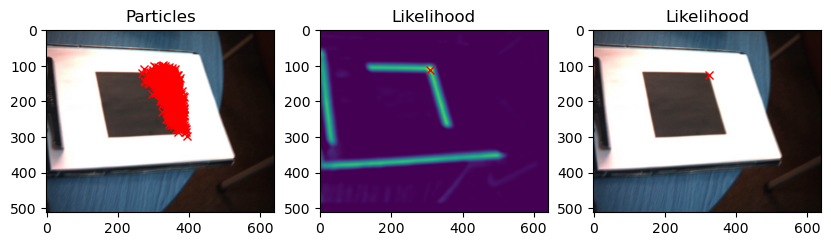

Processing Frame 147
[317.30143945 134.12198697]


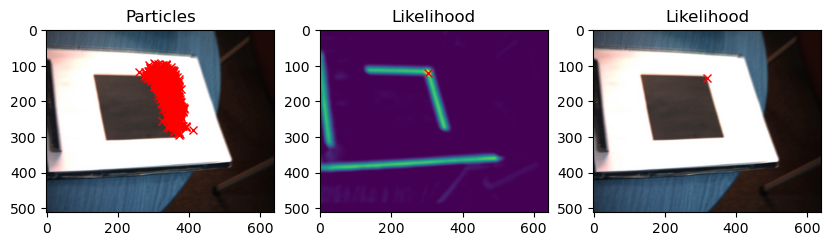

Processing Frame 148
[310.59726552 138.85580877]


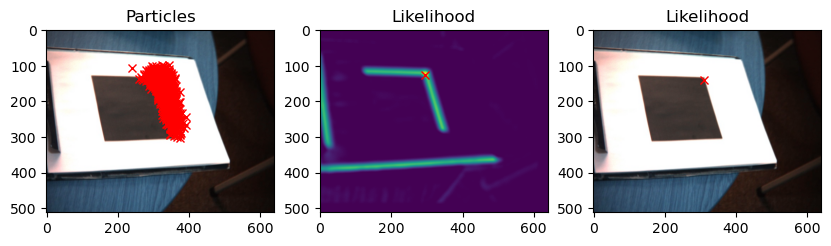

Processing Frame 149
[310.69371383 142.661759  ]


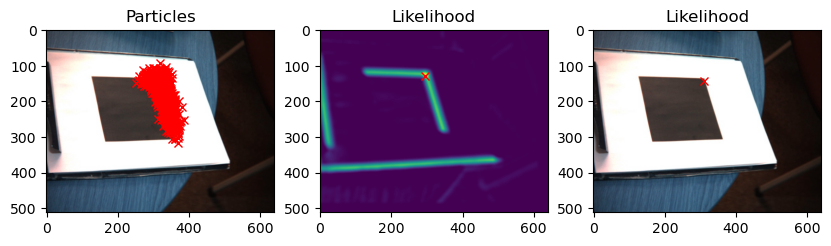

Processing Frame 150
[310.06533647 141.1845293 ]


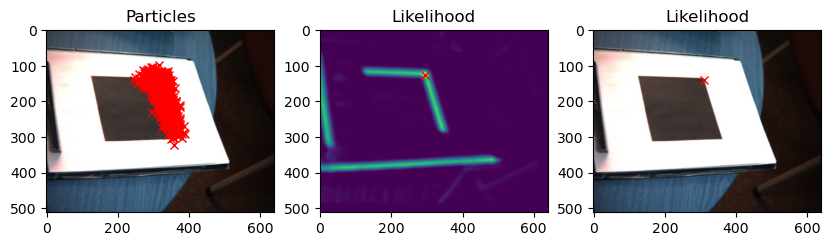

In [4]:
ll = HW2_Practical7c('ur')

***Explanation***
1. Above 150 figures show all sample points with red marks, likelihood map with one red mark representing the highest weight and the position of the highest mark on the original image.  
2. In the begining, all sample points are generated randomly but they tend to move to positions with higher weights. And at last they move to the up right corner.  
